In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler 
from sklearn import preprocessing
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
import warnings

# Suprimir todos os avisos
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_excel(r'C:\Users\gabriel.valadao\Downloads\galo\GaloAnalytics\Data\prem_22_23.xlsx')
df.sort_values(by='Minutos jogados:')

,Jogador,Equipa,Posição,Idade,Valor de mercado,Contrato termina,Partidas jogadas,Minutos jogados:,Golos,Golos esperados,...,Receção de passes em profundidade/90,Cruzamentos em profundidade recebidos/90,Passes progressivos/90,"Passes progressivos certos, %",Livres/90,Livres directos/90,"Pontapés livres directos à baliza, %",Cantos/90,Penaltis marcados,"Conversão de penaltis, %"
442,S. Rondón,River Plate,CF,33,2000000,2025-12-31,7,150,0,0.24,...,1.80,0.00,0.60,100.00,0.0,0.00,0.0,0.0,0,0.000
400,L. Kurzawa,Fulham,LB,30,4000000,2024-06-30,3,151,0,0.00,...,0.00,0.00,0.60,0.00,0.0,0.00,0.0,0.0,0,0.000
309,Bryan Gil,Tottenham Hotspur,"RW, AMF",22,12000000,2026-06-30,4,163,0,0.04,...,0.55,0.55,4.42,62.50,0.0,0.00,0.0,0.0,0,0.000
351,J. Tanganga,Tottenham Hotspur,RCB,24,9000000,2025-06-30,4,163,0,0.00,...,0.00,0.55,7.73,57.14,0.0,0.00,0.0,0.0,0,0.000
475,Juan Larios,Southampton,"LB, RB",19,0,NaN,5,170,0,0.00,...,0.00,0.53,3.71,71.43,0.0,0.00,0.0,0.0,0,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3,H. Kane,Bayern München,CF,30,90000000,2024-06-30,38,3739,30,21.41,...,1.08,0.31,3.59,83.89,0.1,0.07,0.0,0.0,6,83.333
42,Gabriel Magalhaes,Arsenal,LCB,25,50000000,2027-06-30,38,3755,3,4.05,...,0.12,0.02,7.55,74.60,0.0,0.00,0.0,0.0,0,0.000
166,J. Tarkowski,Everton,LCB,30,22000000,2026-06-30,38,3766,1,3.20,...,0.29,0.00,6.72,72.24,0.0,0.00,0.0,0.0,0,0.000
69,A. Ramsdale,Arsenal,GK,25,38000000,2026-06-30,38,3774,0,0.00,...,0.02,0.00,4.84,76.85,NaN,NaN,NaN,0.0,0,0.000


In [3]:
def dividir_posicoes(posicoes_string):
    return posicoes_string.split(', ')

# Aplicar a função a todas as células da coluna 'Posição' e criar uma nova coluna 'Posições Divididas'
df = df[~df['Posição'].apply(lambda x: 'GK' in x)]
df = df[df['Minutos jogados:'] > 720]

df['Posição'] = df['Posição'].apply(dividir_posicoes)
df

,Jogador,Equipa,Posição,Idade,Valor de mercado,Contrato termina,Partidas jogadas,Minutos jogados:,Golos,Golos esperados,...,Receção de passes em profundidade/90,Cruzamentos em profundidade recebidos/90,Passes progressivos/90,"Passes progressivos certos, %",Livres/90,Livres directos/90,"Pontapés livres directos à baliza, %",Cantos/90,Penaltis marcados,"Conversão de penaltis, %"
0,E. Haaland,Manchester City,[CF],23,170000000,2027-06-30,35,2996,36,28.10,...,1.29,0.15,1.05,71.43,0.00,0.00,0.0,0.03,7,100.000
1,B. Saka,Arsenal,"[RWF, RAMF, RW]",21,110000000,2027-06-30,38,3468,14,10.13,...,1.63,0.91,3.61,77.70,0.18,0.03,0.0,2.54,3,66.667
2,P. Foden,Manchester City,"[LWF, RWF, LAMF]",23,110000000,2027-06-30,32,2022,11,6.11,...,2.05,0.93,4.14,87.10,0.40,0.04,100.0,1.74,0,0.000
3,H. Kane,Bayern München,[CF],30,90000000,2024-06-30,38,3739,30,21.41,...,1.08,0.31,3.59,83.89,0.10,0.07,0.0,0.00,6,83.333
4,E. Fernández,Chelsea,"[DMF, RCMF, LDMF]",22,85000000,2031-06-30,18,1699,0,0.98,...,1.32,0.21,10.22,82.90,0.37,0.11,0.0,0.16,0,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
465,T. Ream,Fulham,[LCB],36,1000000,2024-06-30,33,3177,1,0.53,...,0.11,0.00,8.64,75.74,0.00,0.00,0.0,0.00,0,0.000
467,A. Ogbonna,West Ham United,"[LCB, CB]",35,1000000,2024-06-30,16,1366,0,0.17,...,0.07,0.00,3.43,57.69,0.00,0.00,0.0,0.00,0,0.000
472,Hugo Bueno,Wolverhampton Wanderers,[LB],21,200000,2026-06-30,21,1428,0,0.14,...,0.32,0.88,4.66,63.51,0.25,0.00,0.0,1.13,0,0.000
473,D. Ouattara,Bournemouth,"[RW, RAMF]",21,0,2026-06-30,19,1336,1,3.18,...,1.15,1.01,4.24,61.90,0.00,0.00,0.0,0.07,0,0.000


In [4]:
todas_posicoes = []
for posicoes_lista in df['Posição']:
    todas_posicoes.extend(posicoes_lista)
posicoes_unicas = set(todas_posicoes)

# Exibir a lista de posições únicas
print(posicoes_unicas)

{'LWB', 'LB', 'LW', 'LCB', 'RDMF', 'RWF', 'AMF', 'RCB', 'RW', 'LWF', 'DMF', 'RCMF', 'CB', 'RWB', 'LAMF', 'LCMF', 'CF', 'RAMF', 'RB', 'LDMF'}


In [5]:
#dropando goleiros que não podem ser avaliados bem
df = df[~df['Posição'].apply(lambda x: 'GK' in x)]
df.reset_index(drop=True, inplace=True)

In [6]:
# Filtrar e imprimir os jogadores que têm "LB" na lista de posições
jogadores_com_lb = df[df['Posição'].apply(lambda x: 'LB' in x)]
print(jogadores_com_lb)

               Jogador                   Equipa         Posição  Idade  \
30        João Cancelo                Barcelona            [LB]     29   
47        A. Robertson                Liverpool            [LB]     29   
57        O. Zinchenko                  Arsenal            [LB]     26   
61      Marc Cucurella                  Chelsea  [LB, LCB, LWB]     25   
72             L. Shaw        Manchester United       [LB, LCB]     28   
76         Diogo Dalot        Manchester United        [RB, LB]     24   
77         B. Chilwell                  Chelsea       [LB, LWB]     26   
79              N. Aké          Manchester City       [LB, LCB]     28   
92          A. Laporte          Manchester City       [LCB, LB]     29   
96           M. Akanji          Manchester City  [RCB, LB, LCB]     28   
107        T. Mitchell           Crystal Palace            [LB]     23   
120   K. Walker-Peters              Southampton        [RB, LB]     26   
128          J. Justin           Leice

In [7]:
# Dicionário de mapeamento de grupos para posições
mapeamento_faixaH = {
    'Defensores': ['RB', 'LB', 'RCB', 'LCB', 'CB', 'LWB', 'RWB'],
    'Meias': ['LCMF', 'LDMF', 'RAMF', 'RCMF', 'RDMF', 'AMF', 'LAMF', 'DMF'],
    'Atacantes': ['LW', 'RW', 'LWF', 'RWF', 'CF']
}

mapeamento_grupo = {
    'Def': ['RB', 'LB', 'RCB', 'LCB', 'CB', 'LWB', 'RWB'],
    'Vol': ['LCMF', 'LDMF', 'RCMF', 'RDMF', 'AMF', 'DMF'],
    'Lado':['RAMF','LAMF','LW', 'RW','LWF', 'RWF'],
    'Ata': ['CF']
}

mapeamento_grupoE = {
     'Zagueiro': ['RCB', 'LCB', 'CB'],
    'Lateral D': ['RB', 'RWB'],
    'Lateral E': ['LB','LWB'],
    'Volante': ['LDMF', 'RDMF', 'DMF'],
    'Meia': ['AMF', 'LCMF', 'RCMF'],
    'Extremo':['LW', 'RW','LWF', 'RWF', 'RAMF','LAMF'],
    'Atacante': ['CF']
}

# Função para mapear posições para grupos
def mapear_para_grupo1(posicoes):
    grupos = set()
    for posicao in posicoes:
        for grupo, posicoes_grupo in mapeamento_faixaH.items():
            if posicao in posicoes_grupo:
                grupos.add(grupo)
    return list(grupos)

def mapear_para_grupo(posicoes):
    grupos = set()
    for posicao in posicoes:
        for grupo, posicoes_grupo in mapeamento_grupo.items():
            if posicao in posicoes_grupo:
                grupos.add(grupo)
    return list(grupos)

def mapear_para_grupoE(posicoes):
    grupos = set()
    for posicao in posicoes:
        for grupo, posicoes_grupo in mapeamento_grupoE.items():
            if posicao in posicoes_grupo:
                grupos.add(grupo)
    return list(grupos)

# Aplicar a função para criar a coluna faixa_atuação
df['faixa_atuação'] = df['Posição'].apply(mapear_para_grupo1)
df['grupo_atuação'] = df['Posição'].apply(mapear_para_grupo)
df['grupoE_atuação'] = df['Posição'].apply(mapear_para_grupoE)
def extrair_posicao_principal(posicoes):
    if isinstance(posicoes, list) and len(posicoes) > 0:
        return posicoes[0]
    else:
        return None

# Aplicar a função para criar a coluna 'Posição principal'
df['Posição_principal'] = df['Posição'].apply(extrair_posicao_principal)
def mapear_posicao(posicao):
    for grupo, posicoes in mapeamento_grupoE.items():
        if posicao in posicoes:
            return grupo
    return 'Outro'  # Caso não haja correspondência, você pode definir um valor padrão ou tratamento específico

# Aplicar a função à coluna 'Posição principal' e armazenar os resultados na coluna 'Grupo_atuação'
df['Grupo atuação principal'] = df['Posição_principal'].apply(mapear_posicao)
df = df[~df['Posição'].apply(lambda x: 'GK' in x)]

df

,Jogador,Equipa,Posição,Idade,Valor de mercado,Contrato termina,Partidas jogadas,Minutos jogados:,Golos,Golos esperados,...,Livres directos/90,"Pontapés livres directos à baliza, %",Cantos/90,Penaltis marcados,"Conversão de penaltis, %",faixa_atuação,grupo_atuação,grupoE_atuação,Posição_principal,Grupo atuação principal
0,E. Haaland,Manchester City,[CF],23,170000000,2027-06-30,35,2996,36,28.10,...,0.00,0.0,0.03,7,100.000,[Atacantes],[Ata],[Atacante],CF,Atacante
1,B. Saka,Arsenal,"[RWF, RAMF, RW]",21,110000000,2027-06-30,38,3468,14,10.13,...,0.03,0.0,2.54,3,66.667,"[Meias, Atacantes]",[Lado],[Extremo],RWF,Extremo
2,P. Foden,Manchester City,"[LWF, RWF, LAMF]",23,110000000,2027-06-30,32,2022,11,6.11,...,0.04,100.0,1.74,0,0.000,"[Meias, Atacantes]",[Lado],[Extremo],LWF,Extremo
3,H. Kane,Bayern München,[CF],30,90000000,2024-06-30,38,3739,30,21.41,...,0.07,0.0,0.00,6,83.333,[Atacantes],[Ata],[Atacante],CF,Atacante
4,E. Fernández,Chelsea,"[DMF, RCMF, LDMF]",22,85000000,2031-06-30,18,1699,0,0.98,...,0.11,0.0,0.16,0,0.000,[Meias],[Vol],"[Meia, Volante]",DMF,Volante
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346,T. Ream,Fulham,[LCB],36,1000000,2024-06-30,33,3177,1,0.53,...,0.00,0.0,0.00,0,0.000,[Defensores],[Def],[Zagueiro],LCB,Zagueiro
347,A. Ogbonna,West Ham United,"[LCB, CB]",35,1000000,2024-06-30,16,1366,0,0.17,...,0.00,0.0,0.00,0,0.000,[Defensores],[Def],[Zagueiro],LCB,Zagueiro
348,Hugo Bueno,Wolverhampton Wanderers,[LB],21,200000,2026-06-30,21,1428,0,0.14,...,0.00,0.0,1.13,0,0.000,[Defensores],[Def],[Lateral E],LB,Lateral E
349,D. Ouattara,Bournemouth,"[RW, RAMF]",21,0,2026-06-30,19,1336,1,3.18,...,0.00,0.0,0.07,0,0.000,"[Meias, Atacantes]",[Lado],[Extremo],RW,Extremo


In [8]:
nomes_colunas = df.columns.tolist()
cont=0
for nome_coluna in nomes_colunas:
    print(nome_coluna)
    cont+=1
print(cont)

Jogador
Equipa
Posição
Idade
Valor de mercado
Contrato termina
Partidas jogadas
Minutos jogados:
Golos
Golos esperados
Assistências
Assistências esperadas
Duelos/90
Duelos ganhos, %
Naturalidade
País de nacionalidade
Pé
Altura
Peso
Emprestado
Ações defensivas com êxito/90
Duelos defensivos/90
Duelos defensivos ganhos, %
Duelos aérios/90
Duelos aéreos ganhos, %
Cortes/90
Cortes de carrinho ajust. à posse
Remates intercetados/90
Interseções/90
Interceções ajust. à posse
Faltas/90
Cartões amarelos
Cartões amarelos/90
Cartões vermelhos
Cartões vermelhos/90
Acções atacantes com sucesso/90
Golos/90
Golos sem ser por penálti
Golos sem ser por penálti/90
Golos esperados/90
Golos de cabeça
Golos de cabeça/90
Remate
Remates/90
Remates à baliza, %
Golos marcados, %
Assistências/90
Cruzamentos/90
Cruzamentos certos, %
Cruzamentos do flanco esquerdo/90
Cruzamentos precisos do flanco esquerdo, %
Cruzamentos do flanco direito/90
Cruzamentos precisos do flanco direito, %
Dribles/90
Dribles com sucesso

In [9]:
# criando df numérico
colunas_para_remover = ['Jogador','faixa_atuação','Posição_principal','Grupo atuação principal', 'grupo_atuação', 'grupoE_atuação', 'Equipa', 'Idade','Valor de mercado', 'Minutos jogados:', 'Posição', 'Contrato termina', 'Altura', 'Peso','Emprestado', 'Naturalidade', 'País de nacionalidade', 'Pé']

# Df com atributos numéricos apenas, sem altura e peso pois muitos não são informados
df_atrib = df.drop(columns=colunas_para_remover)
df_atrib = df_atrib.fillna(0)

In [10]:
# Verificar se há valores vazios em cada coluna
valores_vazios = df_atrib.isnull().any()

# Contar a quantidade de valores vazios em cada coluna
qtd_valores_vazios = df_atrib.isnull().sum()

# Exibir os resultados
print("Valores vazios em cada coluna:")
print(valores_vazios)

print("\nQuantidade de valores vazios em cada coluna:")
print(qtd_valores_vazios)

Valores vazios em cada coluna:
Partidas jogadas                        False
Golos                                   False
Golos esperados                         False
Assistências                            False
Assistências esperadas                  False
                                        ...  
Livres directos/90                      False
Pontapés livres directos à baliza, %    False
Cantos/90                               False
Penaltis marcados                       False
Conversão de penaltis, %                False
Length: 85, dtype: bool

Quantidade de valores vazios em cada coluna:
Partidas jogadas                        0
Golos                                   0
Golos esperados                         0
Assistências                            0
Assistências esperadas                  0
                                       ..
Livres directos/90                      0
Pontapés livres directos à baliza, %    0
Cantos/90                               0
Penaltis marcad

In [11]:
# Aplicar normalização Z
df_atrib_normalizadoZ=(df_atrib-df_atrib.mean())/df_atrib.std()
df_atrib_normalizadoZ = df_atrib_normalizadoZ.fillna(0)

# Aplicar a normalização Min-Max aos atributos numéricos
min_max_scaler = preprocessing.MinMaxScaler()
df_atrib_normalizadoMinMax = min_max_scaler.fit_transform(df_atrib)
df_atrib_normalizadoMinMax = pd.DataFrame(df_atrib_normalizadoMinMax, columns=df_atrib.columns)

# Preencher valores nulos com 0

df_atrib_normalizadoMinMax = df_atrib_normalizadoMinMax.fillna(0)


In [12]:
# Verificar se há valores vazios em cada coluna
valores_vazios = df_atrib.isnull().any()

# Contar a quantidade de valores vazios em cada coluna
qtd_valores_vazios = df_atrib.isnull().sum()

# Exibir os resultados
print("Valores vazios em cada coluna:")
print(valores_vazios)

print("\nQuantidade de valores vazios em cada coluna:")
print(qtd_valores_vazios)

# Verificar se há valores vazios em cada coluna
valores_vazios = df_atrib_normalizadoMinMax.isnull().any()

# Contar a quantidade de valores vazios em cada coluna
qtd_valores_vazios = df_atrib_normalizadoMinMax.isnull().sum()

# Exibir os resultados
print("Valores vazios em cada coluna:")
print(valores_vazios)

print("\nQuantidade de valores vazios em cada coluna:")
print(qtd_valores_vazios)

# Verificar se há valores vazios em cada coluna
valores_vazios = df_atrib_normalizadoZ.isnull().any()

# Contar a quantidade de valores vazios em cada coluna
qtd_valores_vazios = df_atrib_normalizadoZ.isnull().sum()

# Exibir os resultados
print("Valores vazios em cada coluna:")
print(valores_vazios)

print("\nQuantidade de valores vazios em cada coluna:")
print(qtd_valores_vazios)

Valores vazios em cada coluna:
Partidas jogadas                        False
Golos                                   False
Golos esperados                         False
Assistências                            False
Assistências esperadas                  False
                                        ...  
Livres directos/90                      False
Pontapés livres directos à baliza, %    False
Cantos/90                               False
Penaltis marcados                       False
Conversão de penaltis, %                False
Length: 85, dtype: bool

Quantidade de valores vazios em cada coluna:
Partidas jogadas                        0
Golos                                   0
Golos esperados                         0
Assistências                            0
Assistências esperadas                  0
                                       ..
Livres directos/90                      0
Pontapés livres directos à baliza, %    0
Cantos/90                               0
Penaltis marcad

## Plot histograms

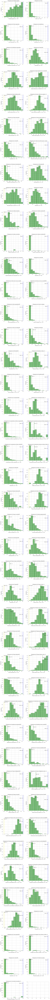

In [17]:
def plot_histograms(df_atrib, max_bins=10):
    num_cols = len(df_atrib.columns)
    num_rows = (num_cols + 1) // 2  # Calcula o número de linhas para dispor os subplots

    fig, axs = plt.subplots(num_rows, 2, figsize=(12, 6*num_rows))
    fig.subplots_adjust(hspace=0.5)  # Ajusta o espaçamento entre os subplots

    for i, col in enumerate(df_atrib.columns):
        # Selecionar a coluna atual
        current_column = df_atrib[col]
        curr_norm = df_atrib_normalizadoMinMax[col]

        # Calcular os valores mínimo, médio e máximo da coluna
        min_value = current_column.min()
        max_value = current_column.max()
        mean_value = current_column.mean()
        variance_value = curr_norm.var()

        # Calcular a amplitude de cada intervalo
        intervalo_amplitude = (max_value - min_value) / max_bins

        # Criar os bins para o histograma
        bins = [min_value + i * intervalo_amplitude for i in range(max_bins + 1)]

        # Plotar o histograma no subplot correspondente
        ax = axs[i//2, i%2]
        n, bins, patches = ax.hist(current_column, bins=bins, edgecolor='black', linewidth=1.0, color='green', alpha=0.5)

        # Adicionar as linhas verticais e os valores como texto
        ax.axvline(min_value, color='yellow', linestyle='dashed', linewidth=2, label='Mínimo')
        ax.text(min_value, n.max(), f'Mínimo: {min_value}', color='black', fontsize=8, ha='left', va='bottom')

        ax.axvline(mean_value, color='green', linestyle='dashed', linewidth=2, label='Média')
        ax.text(mean_value, n.max()-10, f'Média: {mean_value:.2f}', color='black', fontsize=8, ha='left', va='bottom')

        ax.axvline(max_value, color='blue', linestyle='dashed', linewidth=2, label='Máximo')
        ax.text(max_value, n.max()-20, f'Máximo: {max_value}', color='black', fontsize=8, ha='right', va='bottom')

        # Configurar o estilo e a legenda
        ax.set_title(f'Histograma de {col}')
        ax.set_xlabel(f'{col} e var = {variance_value:.2f}')
        ax.set_ylabel('Frequência')
        #ax.legend()

    # Mostrar os subplots
    plt.show()

# Chamando a função para gerar histograma para cada coluna do DataFrame
plot_histograms(df_atrib)

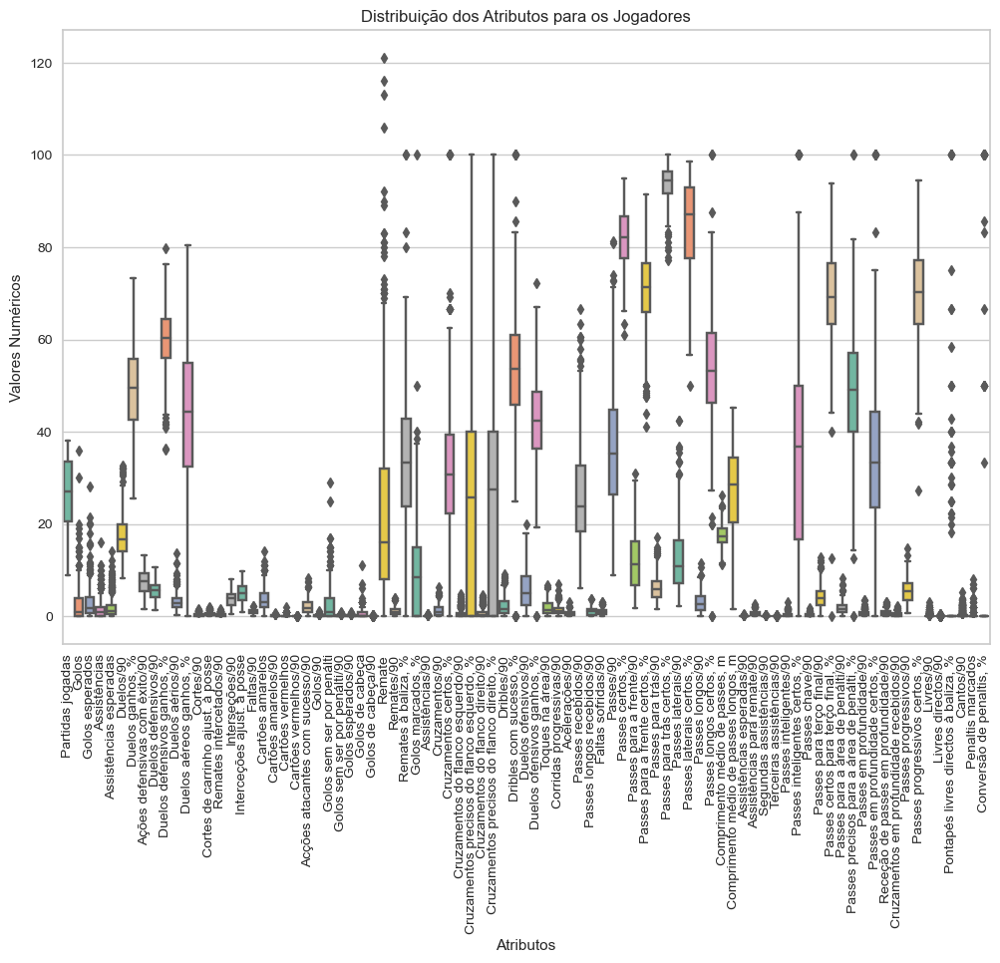

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt

# Configure o tamanho da figura
plt.figure(figsize=(12, 8))

# Plote os boxplots usando o seaborn
sns.boxplot(data=df_atrib, orient="v", palette="Set2")

# Rotacione os rótulos do eixo x para melhor legibilidade
plt.xticks(rotation=90)

# Adicione rótulos aos eixos
plt.xlabel("Atributos")
plt.ylabel("Valores Numéricos")

# Adicione um título ao gráfico
plt.title("Distribuição dos Atributos para os Jogadores")

# Mostre o gráfico
plt.show()

In [19]:
import numpy as np

rs = np.random.RandomState(0)
corr = df_atrib.corr()
corr.style.background_gradient(cmap='coolwarm').set_precision(2)

In [20]:
primeiras_colunas = df_atrib.iloc[:, :20]
primeiras_colunas

,Partidas jogadas,Golos,Golos esperados,Assistências,Assistências esperadas,Duelos/90,"Duelos ganhos, %",Ações defensivas com êxito/90,Duelos defensivos/90,"Duelos defensivos ganhos, %",Duelos aérios/90,"Duelos aéreos ganhos, %",Cortes/90,Cortes de carrinho ajust. à posse,Remates intercetados/90,Interseções/90,Interceções ajust. à posse,Faltas/90,Cartões amarelos,Cartões amarelos/90
0,35,36,28.10,8,4.12,14.60,35.60,1.65,1.41,46.81,3.51,45.30,0.03,0.05,0.12,0.96,1.67,0.90,5,0.15
1,38,14,10.13,9,5.71,24.42,43.36,4.90,5.06,54.87,1.84,30.99,0.00,0.00,0.00,2.13,3.48,1.09,6,0.16
2,32,11,6.11,4,4.46,16.16,44.63,4.23,3.61,56.79,2.23,36.00,0.04,0.08,0.13,2.14,3.78,0.45,1,0.04
3,38,30,21.41,2,5.79,19.28,39.45,2.41,2.05,56.47,4.00,35.54,0.12,0.16,0.17,1.13,1.46,0.75,6,0.14
4,18,0,0.98,2,1.61,13.67,52.33,6.67,5.99,60.18,1.06,35.00,0.21,0.32,0.16,2.86,4.35,0.53,3,0.16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346,33,1,0.53,0,0.00,11.02,62.98,8.78,4.87,68.02,3.09,55.96,0.31,0.41,0.51,5.16,6.79,0.54,2,0.06
347,16,0,0.17,0,0.12,10.34,53.50,7.31,3.62,58.18,4.88,58.11,0.00,0.00,0.46,5.20,5.52,0.13,0,0.00
348,21,0,0.14,1,2.24,18.03,50.70,9.64,8.00,61.42,1.95,48.39,0.06,0.08,0.13,4.66,6.10,0.38,1,0.06
349,19,1,3.18,4,2.25,22.84,46.90,7.61,4.99,63.51,5.59,42.17,0.27,0.28,0.34,4.18,4.40,0.34,1,0.07


In [21]:
import seaborn as sns

def corrdot(*args, **kwargs):
    corr_r = args[0].corr(args[1], 'pearson')
    corr_text = f"{corr_r:2.2f}".replace("0.", ".")
    ax = plt.gca()
    ax.set_axis_off()
    marker_size = abs(corr_r) * 10000
    ax.scatter([.5], [.5], marker_size, [corr_r], alpha=0.6, cmap="coolwarm",
               vmin=-1, vmax=1, transform=ax.transAxes)
    font_size = abs(corr_r) * 40 + 5
    ax.annotate(corr_text, [.5, .5,],  xycoords="axes fraction",
                ha='center', va='center', fontsize=font_size)

sns.set(style='white', font_scale=1.6)
g = sns.PairGrid(primeiras_colunas, aspect=1.4, diag_sharey=False)
g.map_lower(sns.regplot, lowess=True, ci=False, line_kws={'color': 'black'})
g.map_diag(sns.distplot, kde_kws={'color': 'black'})
g.map_upper(corrdot)

Error in callback <function flush_figures at 0x000001DC0600CCC0> (for post_execute):


KeyboardInterrupt: 

In [22]:


# Configurar temporariamente as opções para mostrar todas as linhas e colunas
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

# Obter o resumo estatístico completo do DataFrame
resumo_completo = df.describe()
resumo_completo = df.describe()

# Selecionar apenas as estatísticas de interesse (mean, min e max)
resumo_selecionado = resumo_completo.loc[['mean', 'min', 'max']]

# Exibir o resumo completo após transpor as linhas e colunas
print(resumo_selecionado.transpose())

# Restaurar as configurações originais (opcional)
pd.reset_option('display.max_rows')
pd.reset_option('display.max_columns')
pd.reset_option('display.width')

                                                    mean     min           max
Idade                                       2.686895e+01   18.00  3.800000e+01
Valor de mercado                            2.506467e+07    0.00  1.700000e+08
Partidas jogadas                            2.680627e+01    9.00  3.800000e+01
Minutos jogados:                            2.019689e+03  723.00  3.766000e+03
Golos                                       2.840456e+00    0.00  3.600000e+01
Golos esperados                             3.043818e+00    0.00  2.810000e+01
Assistências                                1.766382e+00    0.00  1.600000e+01
Assistências esperadas                      1.822792e+00    0.00  1.420000e+01
Duelos/90                                   1.729675e+01    8.32  3.269000e+01
Duelos ganhos, %                            4.921527e+01   25.60  7.324000e+01
Altura                                      1.819744e+02  165.00  1.980000e+02
Peso                                        7.456980

Atributos de baixa relevância para Partidas jogadas:
Index(['Comprimento médio de passes longos, m', 'Remates/90',
       'Comprimento médio de passes, m', 'Assistências esperadas/90',
       'Duelos/90', 'Duelos aérios/90', 'Passes progressivos certos, %',
       'Duelos ofensivos ganhos, %',
       'Passes precisos para a área de penálti, %', 'Passes para trás/90',
       'Dribles com sucesso, %', 'Passes longos recebidos/90',
       'Assistências para remate/90', 'Golos esperados/90',
       'Duelos defensivos/90', 'Remates intercetados/90', 'Faltas/90',
       'Duelos ganhos, %', 'Passes para trás certos, %', 'Remates à baliza, %',
       'Dribles/90', 'Passes em profundidade certos, %',
       'Passes inteligentes/90', 'Passes para terço final/90',
       'Passes longos/90', 'Duelos defensivos ganhos, %', 'Acelerações/90',
       'Duelos aéreos ganhos, %', 'Corridas progressivas/90',
       'Passes longos certos, %', 'Passes inteligentes certos, %',
       'Golos marcados, %', 'Du

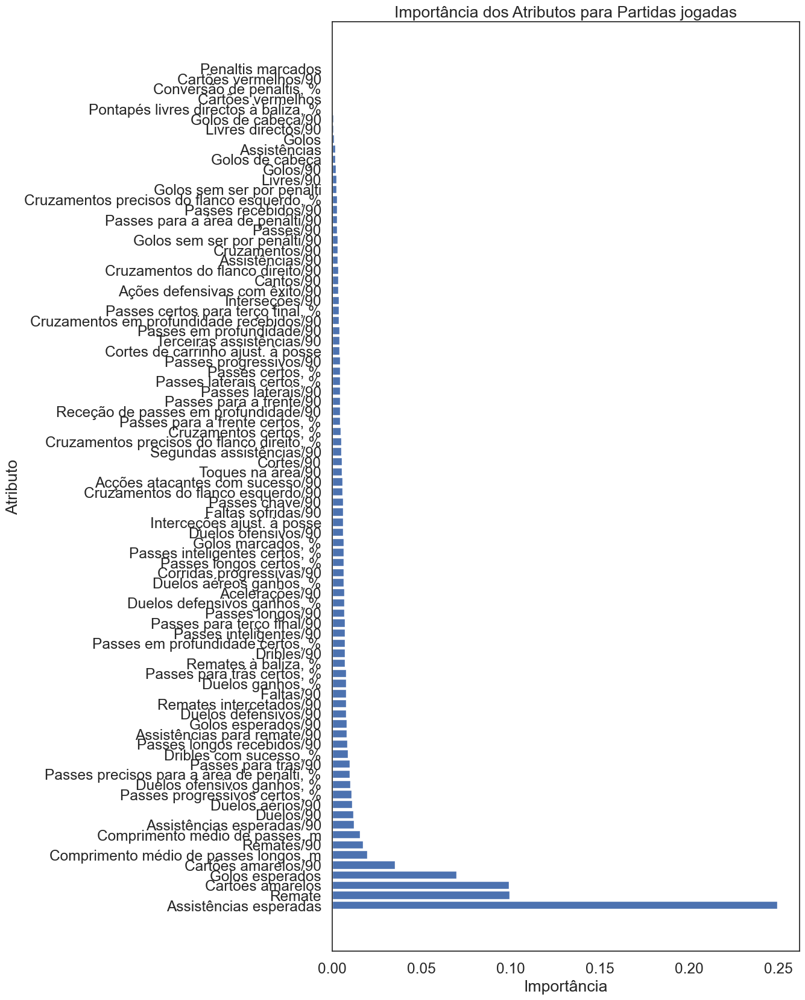

Atributos de baixa relevância para Golos:
Index(['Remate', 'Golos de cabeça', 'Duelos defensivos/90',
       'Ações defensivas com êxito/90', 'Golos/90', 'Penaltis marcados',
       'Golos marcados, %', 'Golos de cabeça/90',
       'Golos sem ser por penálti/90', 'Interseções/90',
       'Comprimento médio de passes longos, m', 'Duelos aéreos ganhos, %',
       'Passes para terço final/90', 'Conversão de penaltis, %',
       'Duelos defensivos ganhos, %', 'Dribles/90', 'Golos esperados/90',
       'Comprimento médio de passes, m',
       'Cruzamentos precisos do flanco esquerdo, %', 'Passes longos/90',
       'Dribles com sucesso, %', 'Cruzamentos do flanco esquerdo/90',
       'Remates intercetados/90', 'Duelos aérios/90',
       'Corridas progressivas/90', 'Duelos/90', 'Passes laterais/90',
       'Cartões amarelos', 'Passes para trás/90', 'Duelos ofensivos ganhos, %',
       'Passes para trás certos, %', 'Passes certos para terço final, %',
       'Faltas sofridas/90', 'Interceções 

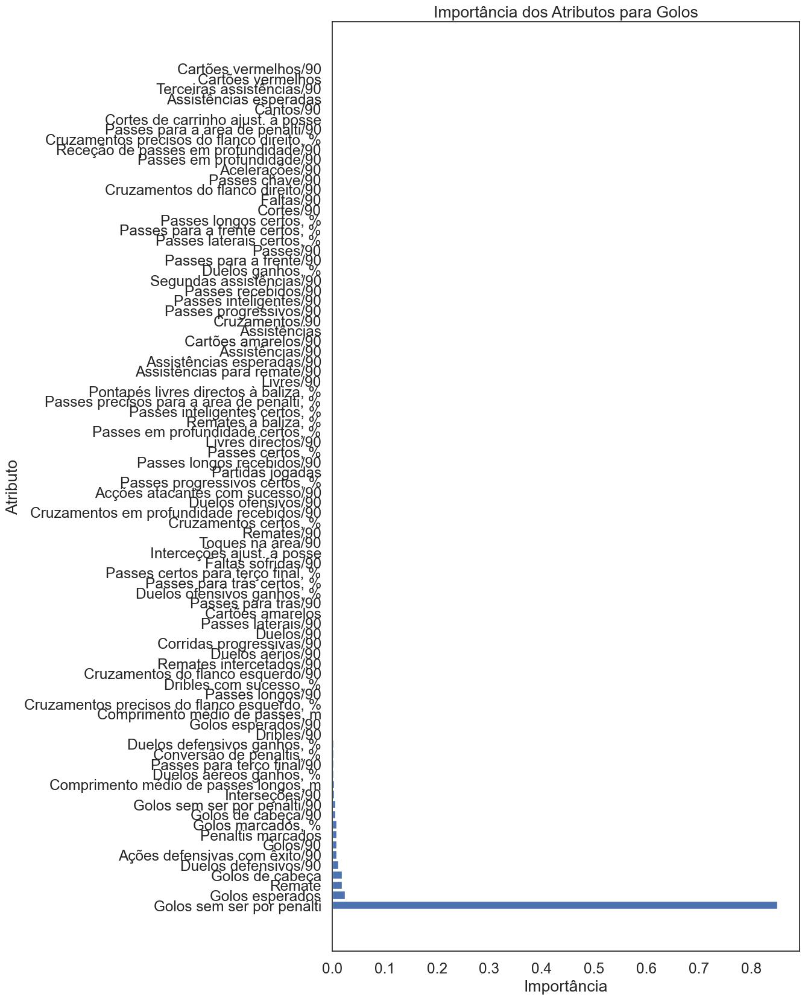

Atributos de baixa relevância para Golos esperados:
Index(['Golos sem ser por penálti', 'Corridas progressivas/90', 'Remates/90',
       'Ações defensivas com êxito/90', 'Penaltis marcados',
       'Partidas jogadas', 'Golos de cabeça/90', 'Remates à baliza, %',
       'Golos/90', 'Golos marcados, %',
       'Comprimento médio de passes longos, m', 'Duelos aérios/90',
       'Passes para trás certos, %', 'Golos de cabeça', 'Dribles/90',
       'Duelos defensivos ganhos, %', 'Cantos/90',
       'Cruzamentos precisos do flanco direito, %', 'Cruzamentos/90',
       'Passes precisos para a área de penálti, %', 'Faltas/90',
       'Comprimento médio de passes, m', 'Passes longos/90',
       'Golos sem ser por penálti/90', 'Duelos ofensivos ganhos, %',
       'Passes laterais/90', 'Duelos/90', 'Duelos ofensivos/90',
       'Passes em profundidade/90', 'Passes longos recebidos/90',
       'Toques na área/90', 'Passes longos certos, %',
       'Passes progressivos/90', 'Dribles com sucesso, %'

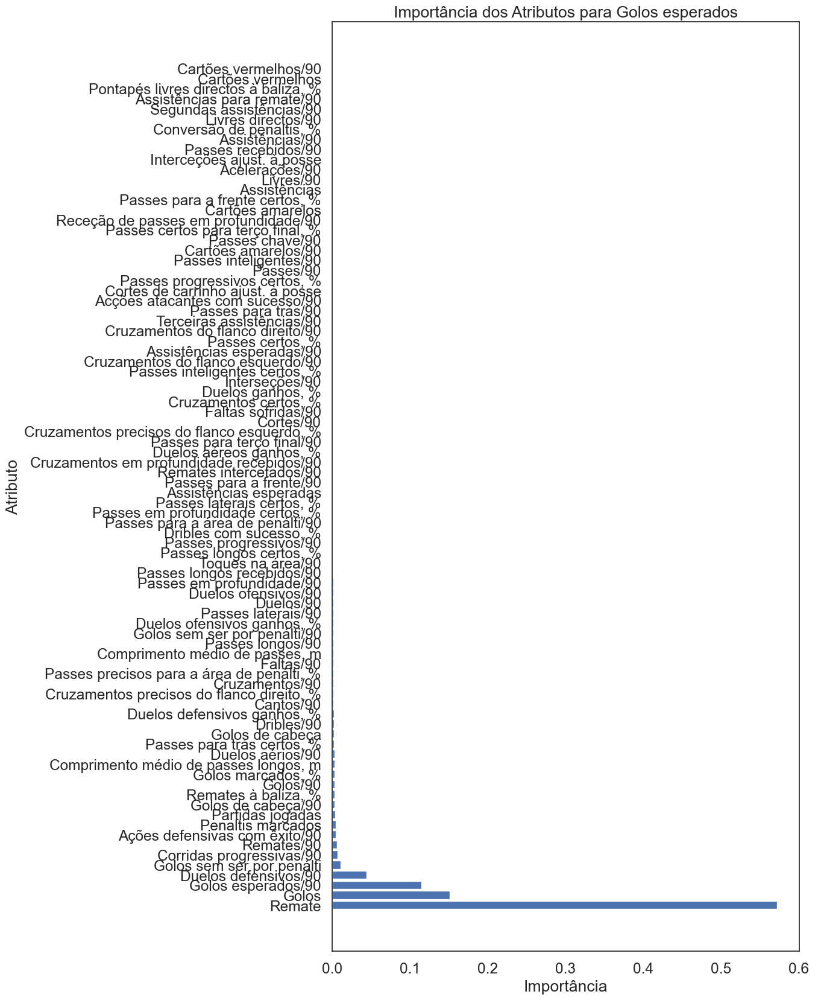

Atributos de baixa relevância para Assistências:
Index(['Partidas jogadas', 'Passes progressivos certos, %', 'Remate',
       'Acções atacantes com sucesso/90', 'Assistências esperadas/90',
       'Passes inteligentes/90', 'Faltas/90', 'Duelos/90',
       'Cruzamentos do flanco direito/90',
       'Comprimento médio de passes longos, m', 'Passes em profundidade/90',
       'Passes para a área de penálti/90', 'Cruzamentos do flanco esquerdo/90',
       'Cartões amarelos', 'Cruzamentos/90', 'Passes chave/90',
       'Passes longos recebidos/90', 'Remates intercetados/90',
       'Cartões amarelos/90', 'Passes para trás certos, %',
       'Passes laterais/90', 'Toques na área/90',
       'Passes em profundidade certos, %', 'Faltas sofridas/90',
       'Cruzamentos em profundidade recebidos/90', 'Duelos ganhos, %',
       'Corridas progressivas/90', 'Cruzamentos precisos do flanco direito, %',
       'Passes para terço final/90', 'Duelos defensivos ganhos, %',
       'Dribles com sucesso, 

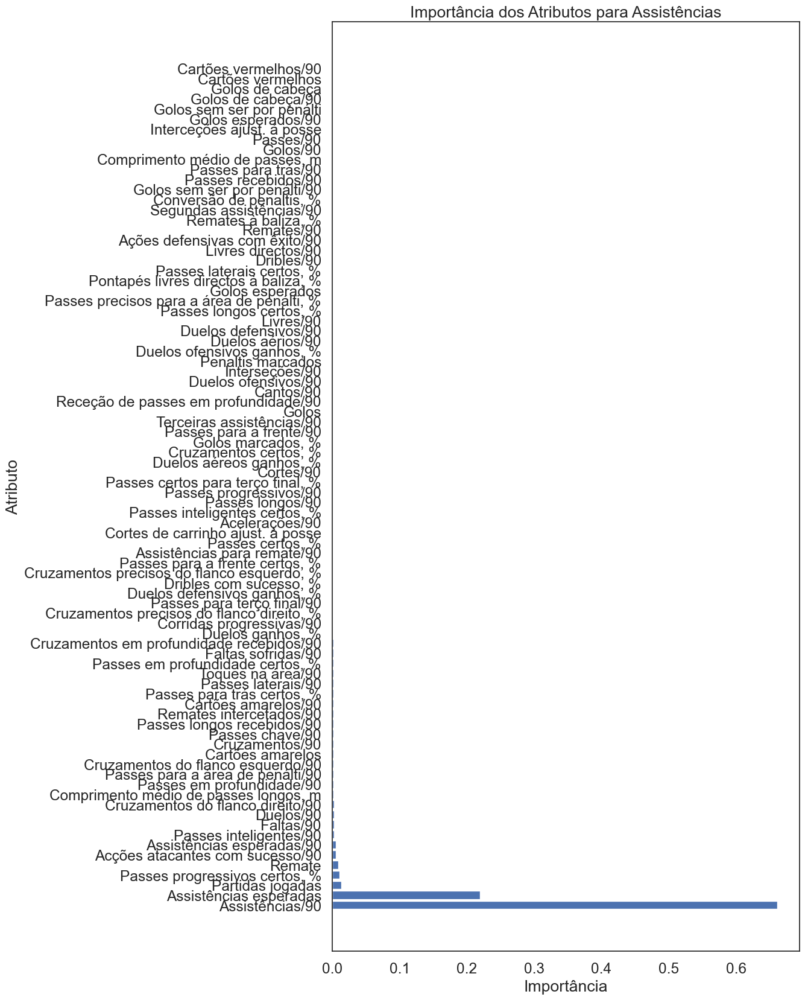

Atributos de baixa relevância para Assistências esperadas:
Index(['Remate', 'Cantos/90', 'Comprimento médio de passes longos, m',
       'Passes para a área de penálti/90', 'Livres/90', 'Livres directos/90',
       'Corridas progressivas/90', 'Cruzamentos do flanco direito/90',
       'Passes para terço final/90', 'Passes para a frente/90',
       'Cruzamentos em profundidade recebidos/90', 'Passes em profundidade/90',
       'Comprimento médio de passes, m', 'Passes chave/90',
       'Toques na área/90', 'Golos esperados', 'Passes inteligentes/90',
       'Segundas assistências/90', 'Cartões amarelos',
       'Passes progressivos certos, %', 'Faltas/90', 'Cruzamentos certos, %',
       'Acelerações/90', 'Dribles/90', 'Duelos aérios/90', 'Golos',
       'Passes longos recebidos/90', 'Cortes/90', 'Dribles com sucesso, %',
       'Remates intercetados/90', 'Remates à baliza, %',
       'Passes em profundidade certos, %', 'Passes para trás certos, %',
       'Passes/90', 'Passes certos pa

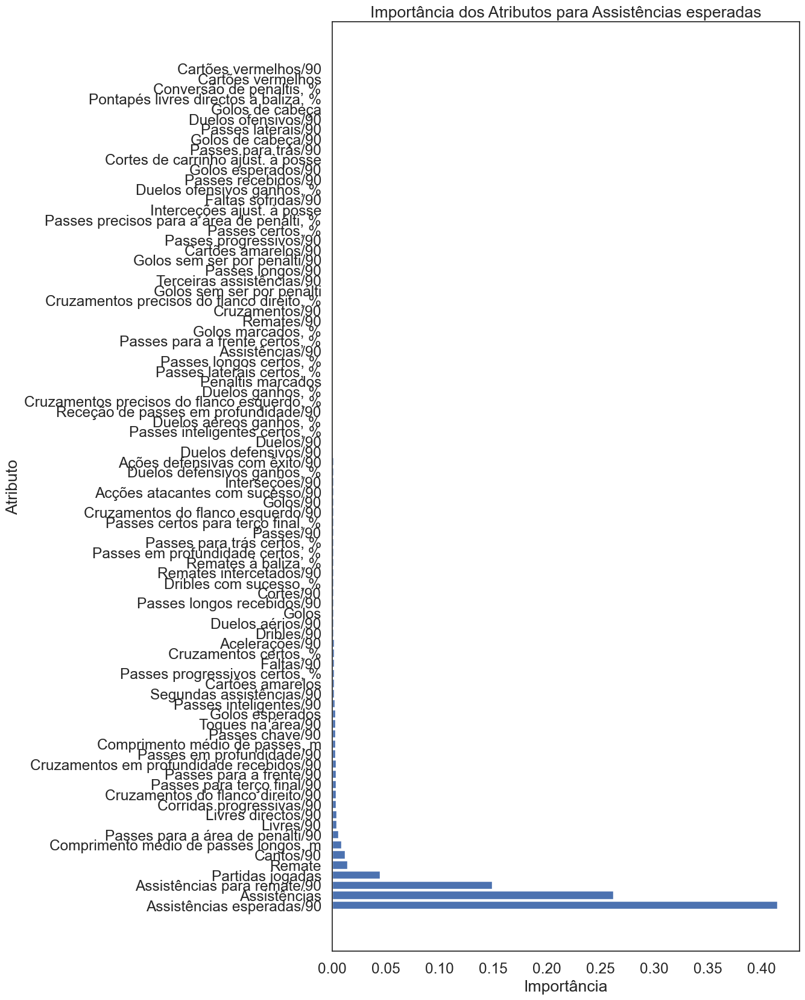

Atributos de baixa relevância para Duelos/90:
Index(['Faltas sofridas/90', 'Ações defensivas com êxito/90',
       'Passes recebidos/90', 'Golos de cabeça/90',
       'Passes progressivos certos, %', 'Assistências para remate/90',
       'Dribles/90', 'Passes para trás certos, %', 'Passes certos, %',
       'Duelos defensivos ganhos, %', 'Acções atacantes com sucesso/90',
       'Acelerações/90', 'Passes para a frente certos, %', 'Golos marcados, %',
       'Passes laterais certos, %', 'Cruzamentos/90',
       'Passes para a frente/90', 'Interceções ajust. à posse',
       'Cruzamentos precisos do flanco esquerdo, %',
       'Duelos ofensivos ganhos, %', 'Passes inteligentes/90',
       'Passes longos recebidos/90', 'Partidas jogadas',
       'Comprimento médio de passes, m', 'Cantos/90',
       'Passes em profundidade/90', 'Golos/90',
       'Cruzamentos do flanco direito/90', 'Golos esperados',
       'Passes precisos para a área de penálti, %', 'Remates à baliza, %',
       'Remates

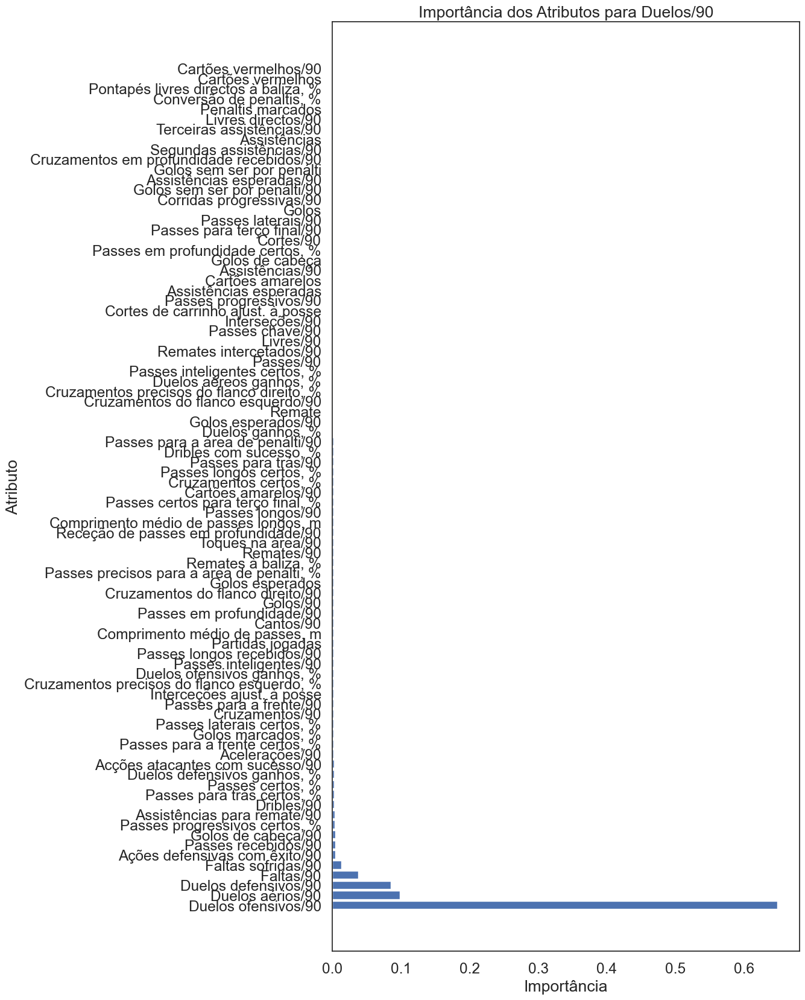

Atributos de baixa relevância para Duelos ganhos, %:
Index(['Duelos ofensivos/90', 'Assistências para remate/90', 'Dribles/90',
       'Remates/90', 'Cruzamentos/90', 'Ações defensivas com êxito/90',
       'Passes progressivos/90', 'Passes longos/90', 'Passes laterais/90',
       'Passes chave/90', 'Passes/90', 'Dribles com sucesso, %',
       'Duelos defensivos/90', 'Cruzamentos em profundidade recebidos/90',
       'Passes para terço final/90', 'Comprimento médio de passes, m',
       'Comprimento médio de passes longos, m', 'Passes longos recebidos/90',
       'Passes para a frente certos, %', 'Faltas/90',
       'Passes precisos para a área de penálti, %',
       'Passes para a área de penálti/90', 'Remates intercetados/90',
       'Remates à baliza, %', 'Cruzamentos do flanco esquerdo/90',
       'Passes laterais certos, %', 'Golos esperados',
       'Receção de passes em profundidade/90', 'Passes para trás/90',
       'Passes longos certos, %', 'Passes recebidos/90', 'Remate',
 

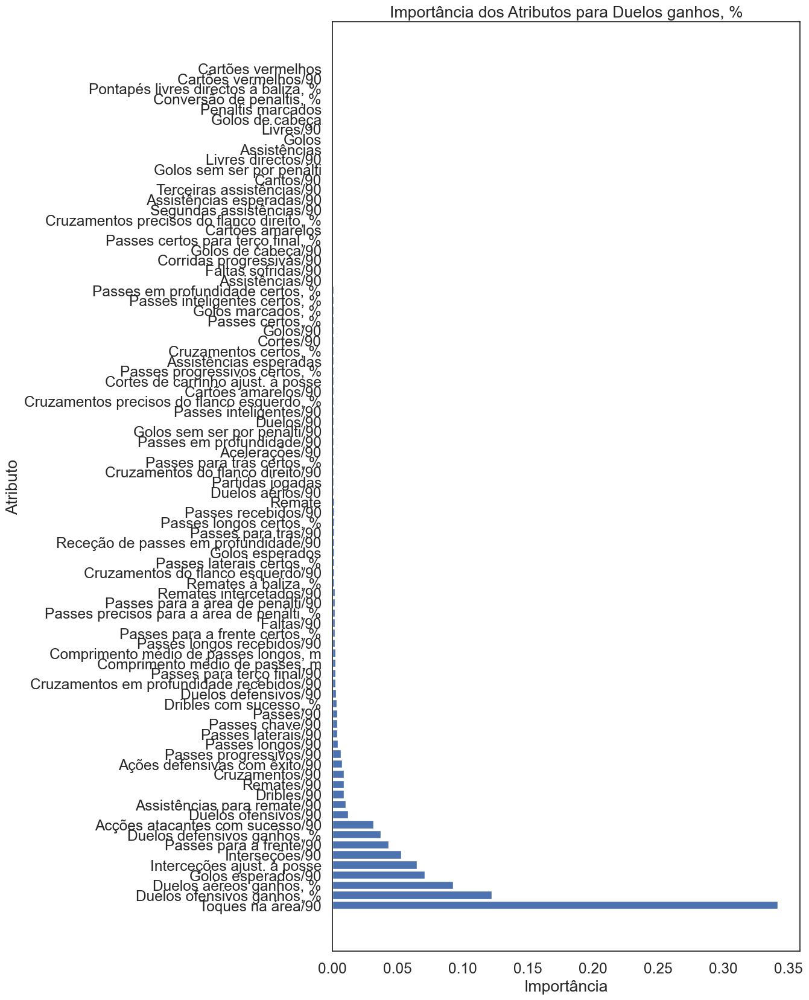

Atributos de baixa relevância para Ações defensivas com êxito/90:
Index(['Interceções ajust. à posse', 'Duelos defensivos ganhos, %',
       'Cortes de carrinho ajust. à posse', 'Cortes/90', 'Duelos/90',
       'Golos esperados', 'Duelos ganhos, %', 'Faltas sofridas/90',
       'Passes para terço final/90', 'Passes progressivos certos, %',
       'Faltas/90', 'Duelos ofensivos ganhos, %', 'Cartões amarelos/90',
       'Remates/90', 'Cruzamentos do flanco direito/90',
       'Passes inteligentes/90', 'Toques na área/90',
       'Passes longos recebidos/90', 'Passes para trás/90', 'Cruzamentos/90',
       'Remate', 'Golos esperados/90', 'Corridas progressivas/90',
       'Passes para a área de penálti/90', 'Passes longos certos, %',
       'Duelos ofensivos/90', 'Passes precisos para a área de penálti, %',
       'Passes longos/90', 'Duelos aéreos ganhos, %', 'Duelos aérios/90',
       'Golos sem ser por penálti/90', 'Receção de passes em profundidade/90',
       'Passes para trás certos

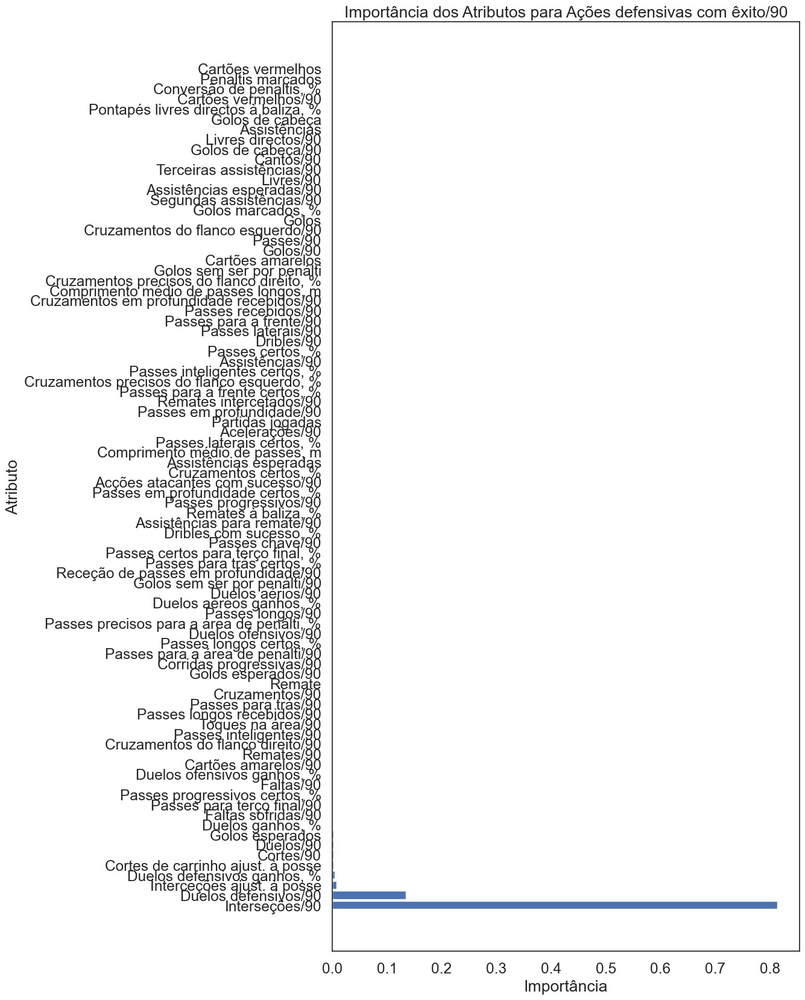

Atributos de baixa relevância para Duelos defensivos/90:
Index(['Duelos defensivos ganhos, %', 'Duelos aérios/90', 'Dribles/90',
       'Duelos aéreos ganhos, %', 'Acções atacantes com sucesso/90',
       'Interseções/90', 'Remates intercetados/90', 'Cruzamentos/90',
       'Passes para trás/90', 'Passes em profundidade certos, %',
       'Cartões amarelos/90', 'Cruzamentos do flanco direito/90',
       'Interceções ajust. à posse', 'Passes laterais certos, %',
       'Passes precisos para a área de penálti, %',
       'Cruzamentos em profundidade recebidos/90', 'Duelos ganhos, %',
       'Assistências para remate/90', 'Corridas progressivas/90',
       'Comprimento médio de passes, m', 'Golos esperados',
       'Passes para a frente certos, %', 'Remates à baliza, %', 'Remates/90',
       'Passes longos/90', 'Partidas jogadas', 'Faltas sofridas/90',
       'Passes certos, %', 'Passes progressivos certos, %',
       'Dribles com sucesso, %', 'Cruzamentos precisos do flanco esquerdo, %',

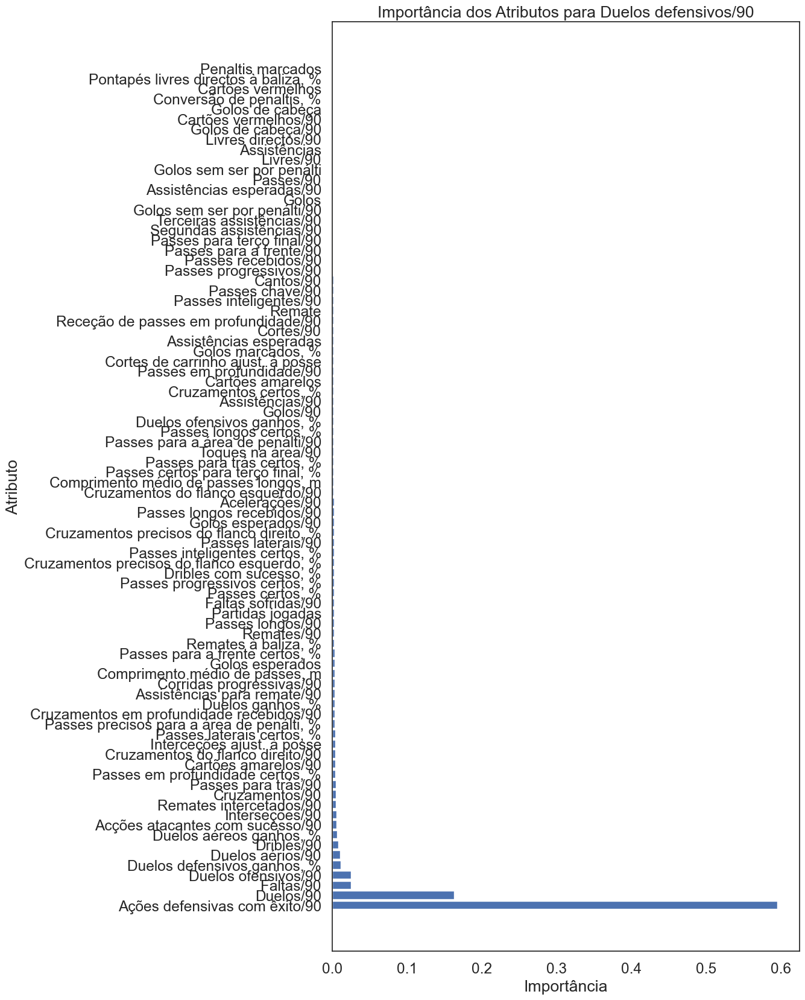

Atributos de baixa relevância para Duelos defensivos ganhos, %:
Index(['Duelos aéreos ganhos, %', 'Duelos aérios/90',
       'Duelos ofensivos ganhos, %', 'Passes laterais certos, %',
       'Interseções/90', 'Passes longos certos, %',
       'Passes em profundidade certos, %', 'Duelos defensivos/90',
       'Passes em profundidade/90',
       'Passes precisos para a área de penálti, %',
       'Passes certos para terço final, %', 'Partidas jogadas',
       'Passes para trás/90', 'Remate', 'Interceções ajust. à posse',
       'Receção de passes em profundidade/90', 'Remates à baliza, %',
       'Comprimento médio de passes, m', 'Passes para a frente certos, %',
       'Passes para trás certos, %', 'Assistências esperadas', 'Duelos/90',
       'Golos esperados', 'Passes progressivos certos, %',
       'Passes inteligentes certos, %',
       'Comprimento médio de passes longos, m', 'Passes longos recebidos/90',
       'Cartões amarelos/90', 'Dribles com sucesso, %',
       'Acções atacan

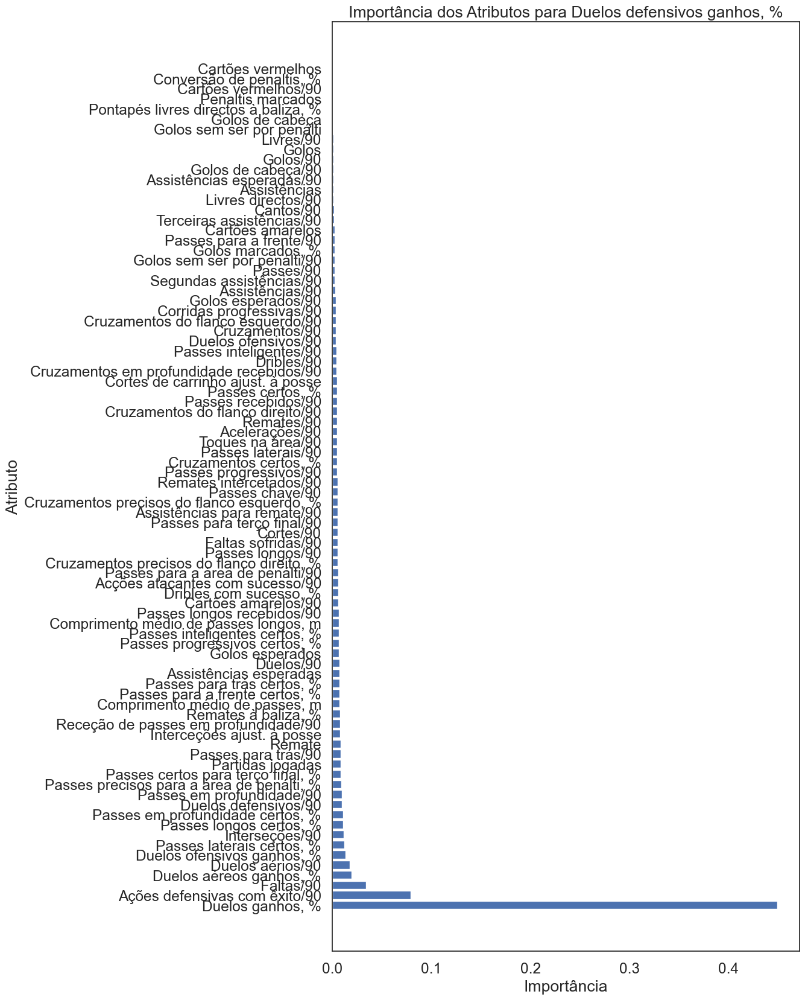

Atributos de baixa relevância para Duelos aérios/90:
Index(['Duelos ofensivos/90', 'Duelos ofensivos ganhos, %', 'Passes chave/90',
       'Duelos ganhos, %', 'Ações defensivas com êxito/90', 'Acelerações/90',
       'Toques na área/90', 'Assistências para remate/90',
       'Golos de cabeça/90', 'Duelos aéreos ganhos, %', 'Golos esperados',
       'Comprimento médio de passes, m', 'Golos esperados/90',
       'Passes laterais/90', 'Receção de passes em profundidade/90',
       'Cortes/90', 'Dribles/90', 'Passes longos recebidos/90', 'Faltas/90',
       'Passes precisos para a área de penálti, %',
       'Passes em profundidade/90', 'Remates/90', 'Passes progressivos/90',
       'Interceções ajust. à posse',
       'Cruzamentos em profundidade recebidos/90', 'Conversão de penaltis, %',
       'Passes inteligentes/90', 'Passes em profundidade certos, %',
       'Passes para a frente/90', 'Partidas jogadas',
       'Passes certos para terço final, %', 'Cartões amarelos/90',
       'Passe

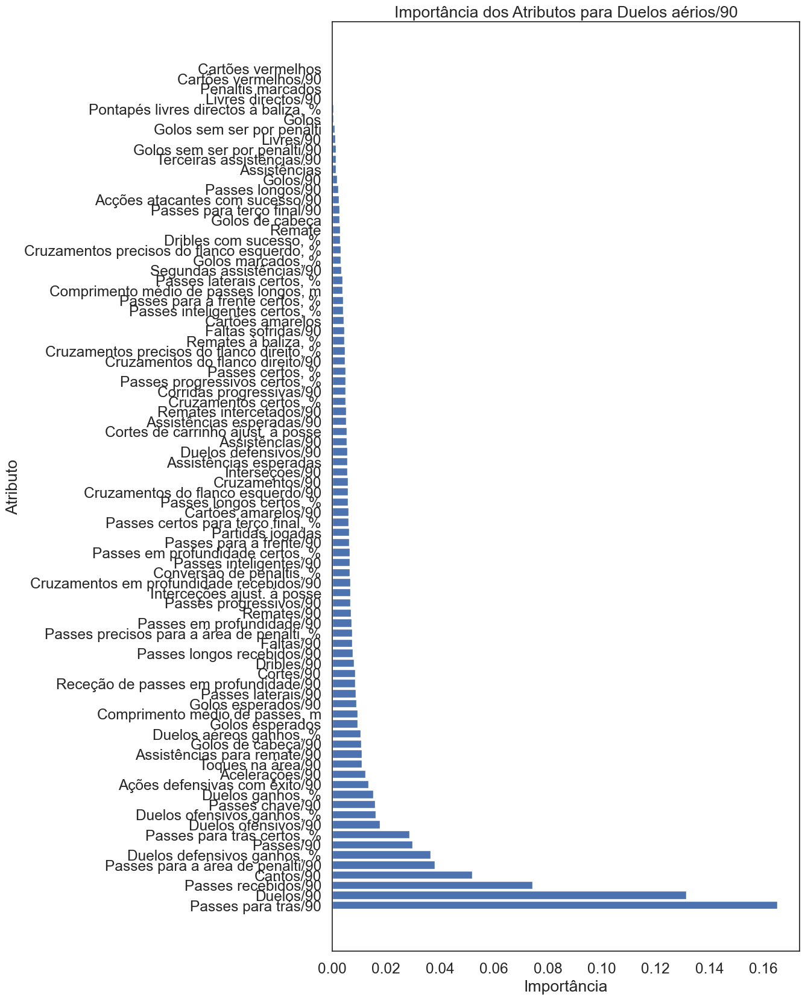

Atributos de baixa relevância para Duelos aéreos ganhos, %:
Index(['Duelos aérios/90', 'Remates à baliza, %', 'Passes para a frente/90',
       'Duelos ofensivos ganhos, %', 'Duelos defensivos ganhos, %',
       'Faltas sofridas/90', 'Acelerações/90', 'Ações defensivas com êxito/90',
       'Passes laterais certos, %', 'Passes longos recebidos/90',
       'Dribles com sucesso, %', 'Duelos ofensivos/90', 'Remates/90',
       'Passes para trás certos, %', 'Passes para trás/90',
       'Cruzamentos certos, %', 'Passes longos certos, %',
       'Cruzamentos do flanco esquerdo/90', 'Duelos/90', 'Faltas/90',
       'Cruzamentos/90', 'Duelos defensivos/90', 'Livres/90', 'Cantos/90',
       'Assistências esperadas', 'Acções atacantes com sucesso/90',
       'Passes certos, %', 'Passes chave/90',
       'Passes para a área de penálti/90', 'Passes em profundidade certos, %',
       'Dribles/90', 'Passes para a frente certos, %',
       'Cruzamentos precisos do flanco direito, %', 'Remate',
     

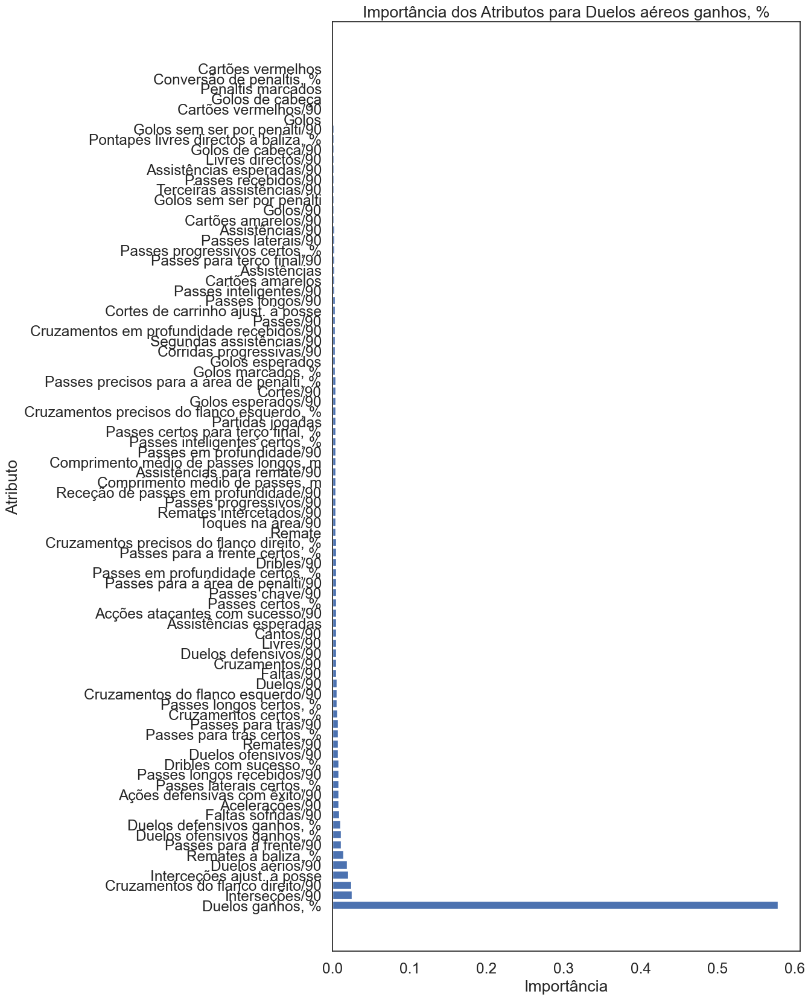

Atributos de baixa relevância para Cortes/90:
Index(['Passes progressivos certos, %', 'Passes recebidos/90',
       'Passes para a frente certos, %', 'Passes/90', 'Interseções/90',
       'Remates intercetados/90', 'Passes longos certos, %',
       'Receção de passes em profundidade/90', 'Duelos defensivos/90',
       'Passes em profundidade certos, %', 'Ações defensivas com êxito/90',
       'Corridas progressivas/90', 'Duelos aérios/90', 'Passes laterais/90',
       'Passes para trás certos, %', 'Golos esperados',
       'Passes para a frente/90', 'Remates à baliza, %', 'Passes certos, %',
       'Faltas sofridas/90', 'Assistências esperadas',
       'Passes precisos para a área de penálti, %', 'Passes para trás/90',
       'Duelos aéreos ganhos, %', 'Passes em profundidade/90',
       'Acelerações/90', 'Assistências para remate/90',
       'Comprimento médio de passes, m', 'Toques na área/90',
       'Passes certos para terço final, %',
       'Cruzamentos precisos do flanco direito

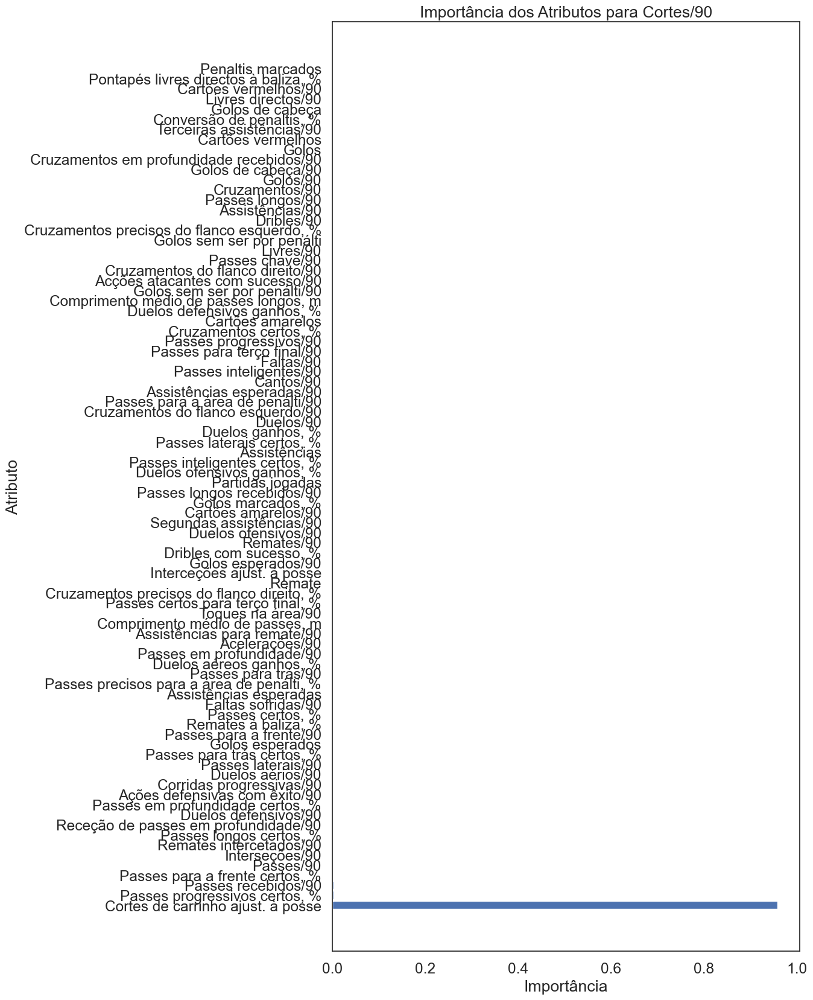

Atributos de baixa relevância para Cortes de carrinho ajust. à posse:
Index(['Passes recebidos/90', 'Passes certos para terço final, %',
       'Passes para a frente certos, %', 'Passes progressivos certos, %',
       'Interseções/90', 'Passes para trás certos, %', 'Passes/90',
       'Passes para terço final/90', 'Passes para trás/90',
       'Assistências para remate/90', 'Corridas progressivas/90',
       'Passes chave/90', 'Passes longos certos, %', 'Passes para a frente/90',
       'Interceções ajust. à posse', 'Cruzamentos certos, %',
       'Duelos aéreos ganhos, %', 'Duelos ganhos, %',
       'Passes em profundidade certos, %', 'Assistências esperadas',
       'Cruzamentos em profundidade recebidos/90',
       'Receção de passes em profundidade/90', 'Passes laterais/90',
       'Passes inteligentes certos, %', 'Faltas/90',
       'Duelos ofensivos ganhos, %', 'Comprimento médio de passes longos, m',
       'Ações defensivas com êxito/90', 'Toques na área/90',
       'Passes cer

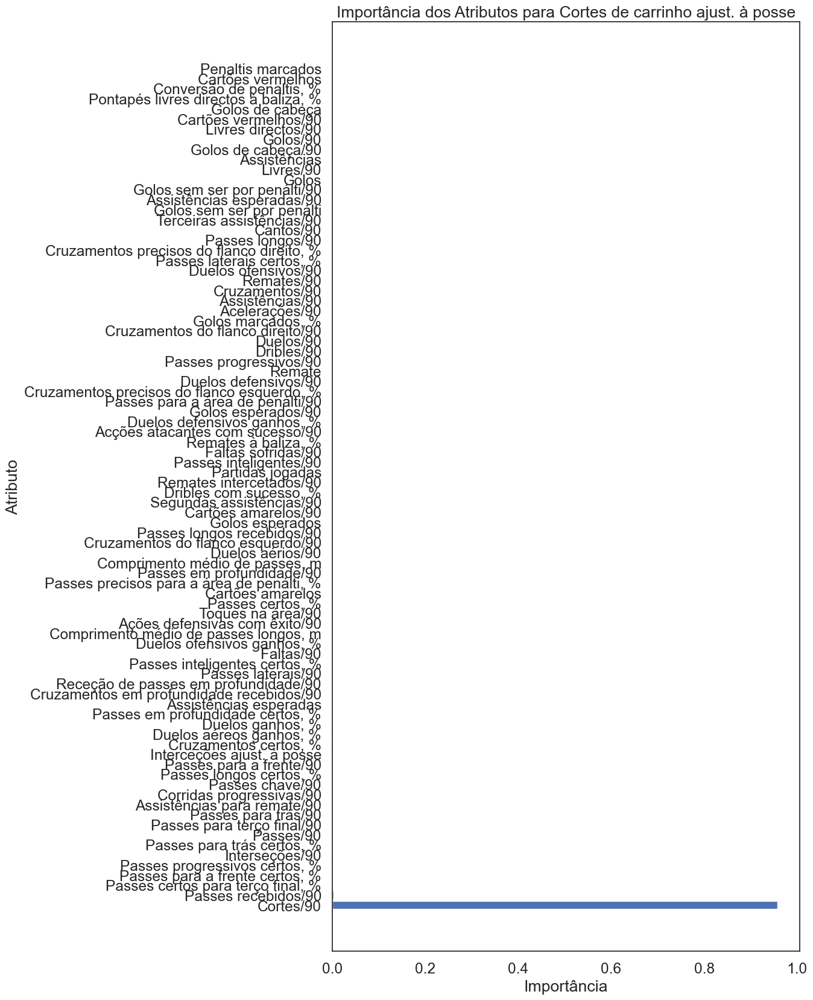

Atributos de baixa relevância para Remates intercetados/90:
Index(['Comprimento médio de passes, m', 'Passes para a área de penálti/90',
       'Ações defensivas com êxito/90', 'Dribles/90', 'Faltas sofridas/90',
       'Cruzamentos/90', 'Duelos aéreos ganhos, %',
       'Passes longos recebidos/90', 'Assistências esperadas',
       'Duelos defensivos ganhos, %', 'Duelos defensivos/90',
       'Remates à baliza, %', 'Passes para trás certos, %',
       'Passes certos para terço final, %', 'Duelos aérios/90',
       'Corridas progressivas/90', 'Interceções ajust. à posse', 'Remate',
       'Dribles com sucesso, %', 'Partidas jogadas',
       'Terceiras assistências/90', 'Cartões amarelos/90', 'Passes certos, %',
       'Comprimento médio de passes longos, m', 'Passes laterais certos, %',
       'Passes progressivos/90', 'Passes inteligentes certos, %',
       'Passes inteligentes/90', 'Passes precisos para a área de penálti, %',
       'Passes para a frente/90', 'Cruzamentos do flanco d

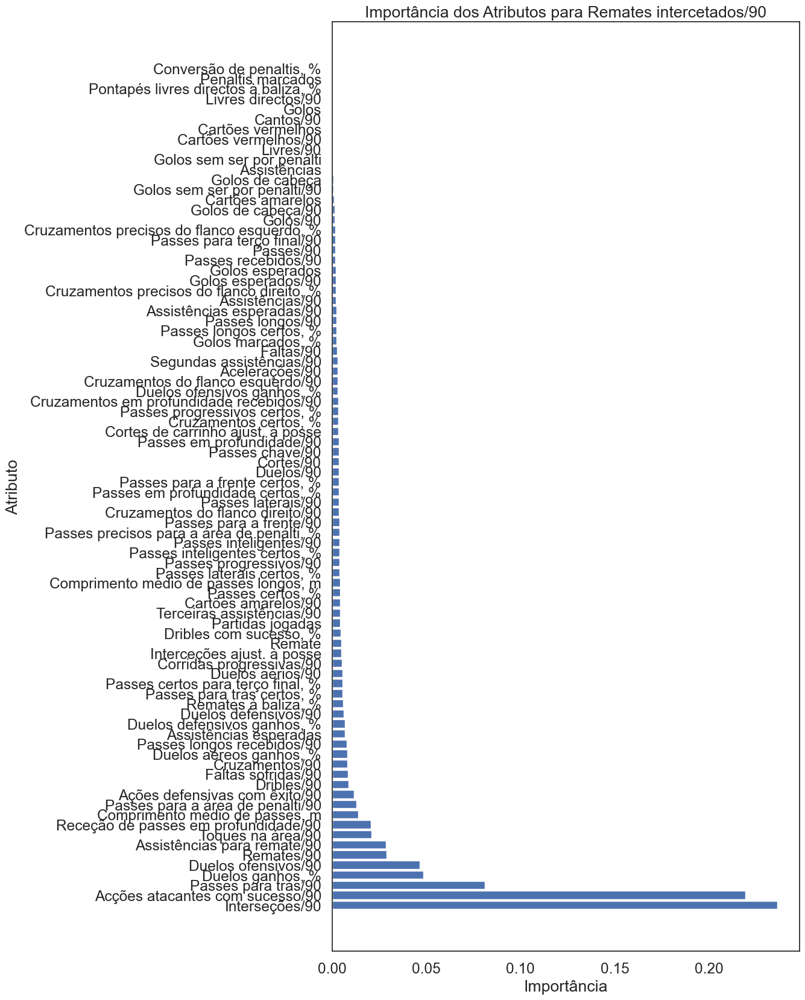

Atributos de baixa relevância para Interseções/90:
Index(['Passes recebidos/90', 'Passes progressivos certos, %',
       'Remates intercetados/90', 'Passes certos para terço final, %',
       'Passes para trás/90', 'Receção de passes em profundidade/90',
       'Comprimento médio de passes, m', 'Passes inteligentes/90',
       'Faltas sofridas/90', 'Passes para terço final/90', 'Remates/90',
       'Acelerações/90', 'Acções atacantes com sucesso/90',
       'Passes longos recebidos/90', 'Duelos ofensivos/90',
       'Duelos defensivos/90', 'Toques na área/90',
       'Passes para trás certos, %', 'Corridas progressivas/90',
       'Dribles com sucesso, %', 'Duelos/90', 'Passes/90', 'Passes certos, %',
       'Passes para a frente/90', 'Golos/90', 'Duelos ganhos, %',
       'Duelos defensivos ganhos, %', 'Dribles/90',
       'Assistências para remate/90', 'Passes longos/90',
       'Passes para a frente certos, %', 'Duelos aéreos ganhos, %',
       'Cortes/90', 'Passes longos certos, %'

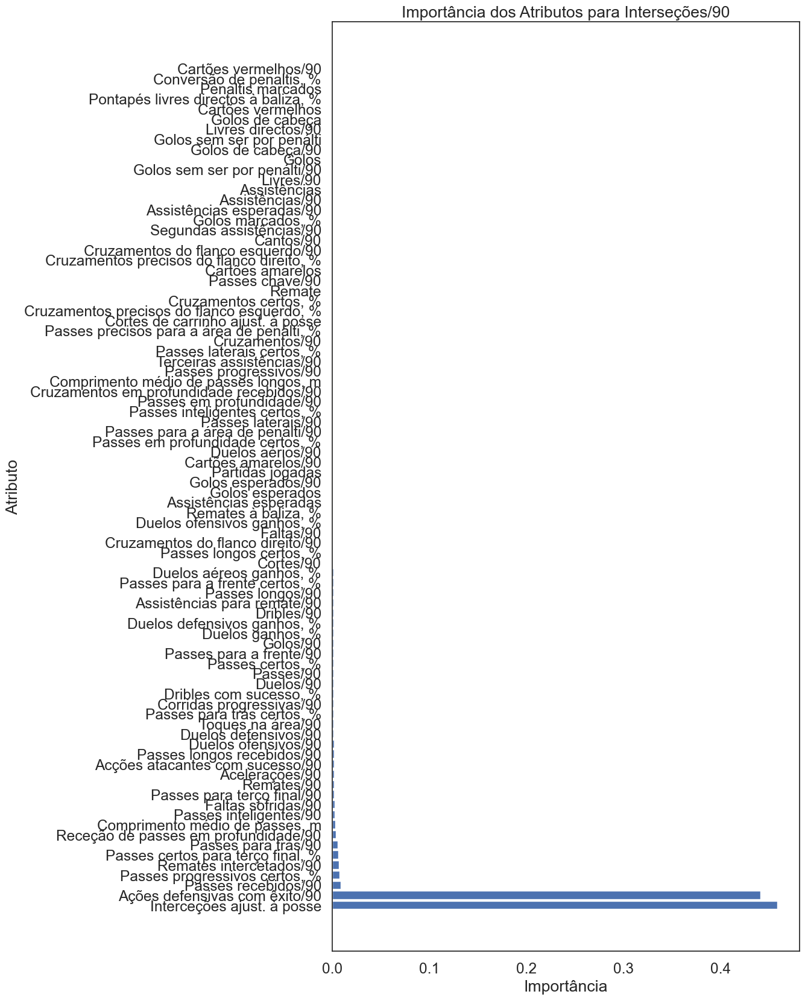

Atributos de baixa relevância para Interceções ajust. à posse:
Index(['Passes recebidos/90', 'Passes para terço final/90',
       'Passes laterais/90', 'Passes para a frente/90',
       'Passes para a frente certos, %', 'Passes certos, %',
       'Ações defensivas com êxito/90', 'Passes progressivos certos, %',
       'Passes longos certos, %', 'Passes certos para terço final, %',
       'Dribles com sucesso, %', 'Passes progressivos/90',
       'Passes laterais certos, %', 'Passes para trás/90', 'Toques na área/90',
       'Comprimento médio de passes longos, m', 'Assistências esperadas',
       'Duelos aérios/90', 'Duelos ganhos, %', 'Passes para trás certos, %',
       'Passes precisos para a área de penálti, %',
       'Duelos ofensivos ganhos, %', 'Faltas sofridas/90',
       'Receção de passes em profundidade/90', 'Duelos aéreos ganhos, %',
       'Passes longos recebidos/90', 'Cartões amarelos/90',
       'Comprimento médio de passes, m', 'Cortes de carrinho ajust. à posse',
   

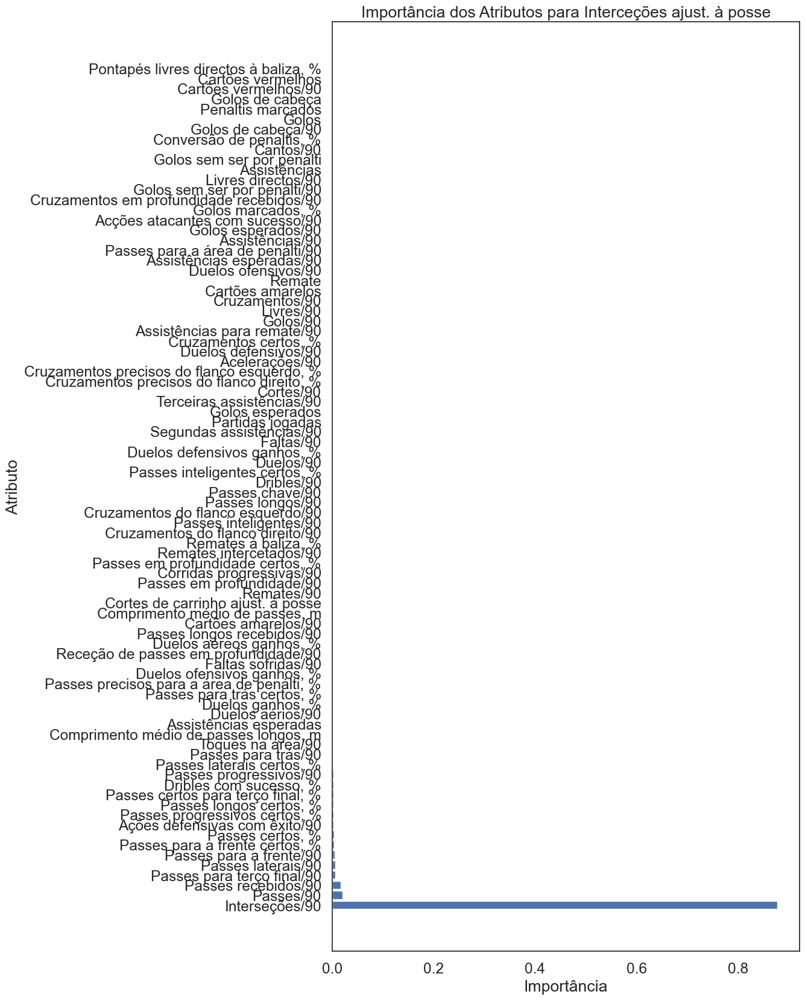

Atributos de baixa relevância para Faltas/90:
Index(['Passes para a área de penálti/90', 'Comprimento médio de passes, m',
       'Cruzamentos do flanco direito/90', 'Passes progressivos/90',
       'Duelos ofensivos/90', 'Cortes de carrinho ajust. à posse', 'Cortes/90',
       'Dribles com sucesso, %', 'Corridas progressivas/90',
       'Comprimento médio de passes longos, m', 'Remates à baliza, %',
       'Acelerações/90', 'Passes longos certos, %', 'Duelos aérios/90',
       'Duelos ofensivos ganhos, %', 'Passes progressivos certos, %',
       'Cruzamentos precisos do flanco esquerdo, %',
       'Passes precisos para a área de penálti, %',
       'Passes longos recebidos/90', 'Passes inteligentes/90',
       'Faltas sofridas/90', 'Passes chave/90',
       'Passes certos para terço final, %', 'Acções atacantes com sucesso/90',
       'Cruzamentos certos, %', 'Assistências esperadas',
       'Cruzamentos do flanco esquerdo/90', 'Passes para a frente/90',
       'Receção de passes em p

In [ ]:
from sklearn.ensemble import RandomForestRegressor

# Criar o modelo RandomForestRegressor
model = RandomForestRegressor(random_state=42)

# Definir um limiar de importância para identificar atributos de baixa relevância
limiar_importancia = 0.02  # Ajuste o valor conforme necessário

# Iterar sobre cada atributo
for col in df_atrib.columns:

    # Separar os atributos e a variável alvo
    X = df_atrib.drop(columns=[col])  # Dropa o atributo atual
    y = df_atrib[col]  # Define o atributo atual como variável alvo

    # Treinar o modelo
    model.fit(X, y)
    
    # Criar um dicionário para armazenar as importâncias de cada atributo
    importances_dict = {}

    # Iterar sobre cada atributo
    for feat in X.columns:
        importances_dict[feat] = model.feature_importances_[X.columns.get_loc(feat)]

    # Converter o dicionário em um DataFrame para visualização
    importances_df = pd.DataFrame.from_dict(importances_dict, orient='index', columns=['Importância'])
    importances_df = importances_df.sort_values(by='Importância', ascending=False)

    # Filtrar os atributos de baixa relevância
    atributos_baixa_relevancia = importances_df[importances_df['Importância'] < limiar_importancia].index
    atributos_alta_relevancia = importances_df[importances_df['Importância'] > limiar_importancia].index

    print(f"Atributos de baixa relevância para {col}:")
    print(atributos_baixa_relevancia)
    print(f"Atributos de alta relevância para {col}:")
    print(atributos_alta_relevancia)
    # Visualizar as importâncias
    plt.figure(figsize=(10, 20))  # Ajuste o tamanho da figura conforme necessário
    plt.barh(importances_df.index, importances_df['Importância'])
    plt.xlabel('Importância')
    plt.ylabel('Atributo')
    plt.title(f'Importância dos Atributos para {col}')
    plt.show()

# Com base nesses atributos selecionamos algumas das colunas consideradas mais relevantes e representativas

In [13]:
colunas_manter_df_1 = [ 'Golos esperados/90',
                     'Ações defensivas com êxito/90', 'Duelos defensivos/90', 'Duelos defensivos ganhos, %',
                     'Duelos aérios/90', 'Duelos aéreos ganhos, %', 'Cortes/90','Remates intercetados/90', 
                     'Interseções/90', 'Faltas/90', 'Golos/90',
                     'Golos sem ser por penálti/90', 'Golos de cabeça/90', 'Remate', 'Remates/90', 'Remates à baliza, %',
                     'Golos marcados, %', 'Assistências/90','Cruzamentos/90', 'Cruzamentos certos, %', 'Dribles/90',
                     'Dribles com sucesso, %','Duelos ofensivos/90', 'Duelos ofensivos ganhos, %', 'Toques na área/90',
                     'Corridas progressivas/90', 'Passes recebidos/90', 'Passes longos recebidos/90', 'Faltas sofridas/90',
                     'Passes certos, %','Passes para a frente/90','Passes para a frente certos, %','Passes longos/90',
                     'Passes longos certos, %','Comprimento médio de passes longos, m', 'Assistências esperadas/90',
                     'Assistências para remate/90', 'Segundas assistências/90', 'Passes inteligentes/90', 
                     'Passes chave/90', 'Passes para terço final/90', 'Passes certos para terço final, %', 
                     'Passes em profundidade/90', 'Passes em profundidade certos, %','Passes progressivos/90',
                     'Passes progressivos certos, %']
df_atrib_relevantes = df_atrib[colunas_manter_df_1]


## TRANDO BOLA PARADA E CARTÕES
df_atrib_relevantes

,Golos esperados/90,Ações defensivas com êxito/90,Duelos defensivos/90,"Duelos defensivos ganhos, %",Duelos aérios/90,"Duelos aéreos ganhos, %",Cortes/90,Remates intercetados/90,Interseções/90,Faltas/90,...,Assistências para remate/90,Segundas assistências/90,Passes inteligentes/90,Passes chave/90,Passes para terço final/90,"Passes certos para terço final, %",Passes em profundidade/90,"Passes em profundidade certos, %",Passes progressivos/90,"Passes progressivos certos, %"
0,0.84,1.65,1.41,46.81,3.51,45.30,0.03,0.12,0.96,0.90,...,0.63,0.12,0.42,0.54,0.66,81.82,0.39,46.15,1.05,71.43
1,0.26,4.90,5.06,54.87,1.84,30.99,0.00,0.00,2.13,1.09,...,1.40,0.16,0.34,0.60,1.66,87.50,0.36,42.86,3.61,77.70
2,0.27,4.23,3.61,56.79,2.23,36.00,0.04,0.13,2.14,0.45,...,1.65,0.09,0.85,0.85,2.54,73.68,1.02,47.83,4.14,87.10
3,0.52,2.41,2.05,56.47,4.00,35.54,0.12,0.17,1.13,0.75,...,0.87,0.07,1.01,0.65,4.04,64.29,1.54,37.50,3.59,83.89
4,0.05,6.67,5.99,60.18,1.06,35.00,0.21,0.16,2.86,0.53,...,0.64,0.05,0.58,0.26,12.82,78.93,1.43,37.04,10.22,82.90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346,0.02,8.78,4.87,68.02,3.09,55.96,0.31,0.51,5.16,0.54,...,0.00,0.00,0.06,0.00,7.00,74.49,0.31,27.27,8.64,75.74
347,0.01,7.31,3.62,58.18,4.88,58.11,0.00,0.46,5.20,0.13,...,0.07,0.00,0.00,0.07,2.04,61.29,0.26,50.00,3.43,57.69
348,0.01,9.64,8.00,61.42,1.95,48.39,0.06,0.13,4.66,0.38,...,1.01,0.00,0.19,0.38,2.08,75.76,0.32,40.00,4.66,63.51
349,0.21,7.61,4.99,63.51,5.59,42.17,0.27,0.34,4.18,0.34,...,1.08,0.00,0.67,0.54,2.29,61.76,0.67,30.00,4.24,61.90


In [14]:

# Invertendo os valores das colunas
df_atrib_relevantes['Faltas/90'] = -1 * df_atrib_relevantes['Faltas/90']

In [15]:
# Aplicar normalização Z
ZScaler = preprocessing.StandardScaler()
df_atrib_relevantes_normalizadoZ=ZScaler.fit_transform(df_atrib_relevantes)
df_atrib_relevantes_normalizadoZ = pd.DataFrame(df_atrib_relevantes_normalizadoZ, columns = df_atrib_relevantes.columns)
df_atrib_relevantes_normalizadoZ = df_atrib_relevantes_normalizadoZ.fillna(0)

# Aplicar a normalização Min-Max aos atributos numéricos
min_max_scaler = preprocessing.MinMaxScaler()
df_atrib_relevantes_normalizadoMinMax = min_max_scaler.fit_transform(df_atrib_relevantes)
df_atrib_relevantes_normalizadoMinMax = pd.DataFrame(df_atrib_relevantes_normalizadoMinMax, columns=df_atrib_relevantes.columns)
df_atrib_relevantes_normalizadoMinMax = df_atrib_relevantes_normalizadoMinMax.fillna(0)

# K-means e análise para df completo, com todas as colunas em outro notebook


# Clusterização usando Kmeans sobre df_normalizado minmax

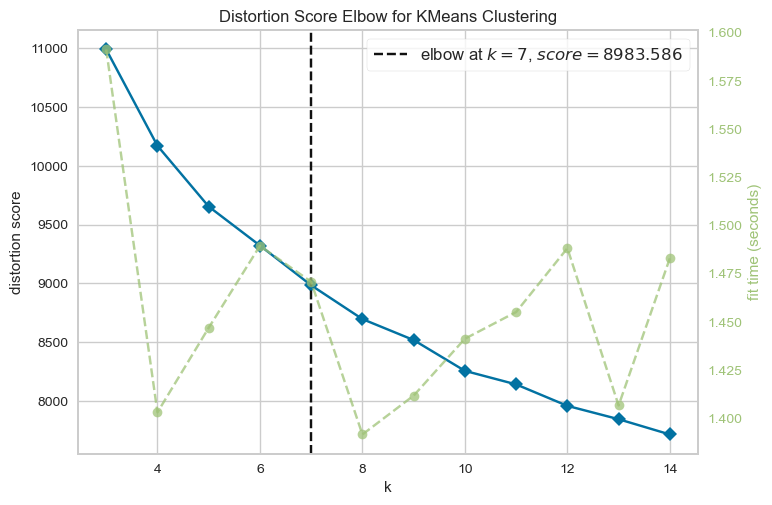

Score para k=5: -1612624.3277218703
Score para k=6: -1516867.4331376953
Score para k=7: -1436476.872290134
Score para k=8: -1377236.1126007447
Score para k=9: -1340863.70489526
Score para k=10: -1304177.4849895323
Score para k=11: -1288306.9318252697
Score para k=12: -1245067.3529864918


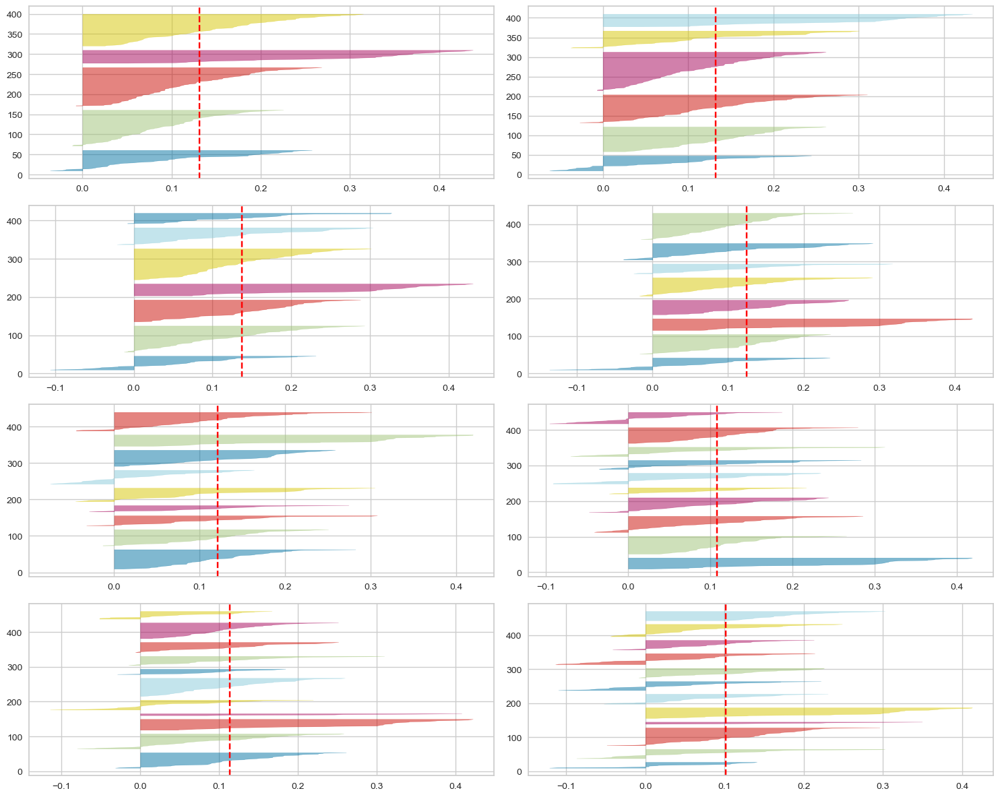

In [16]:
# Load the IRIS dataset
X = df_atrib_relevantes_normalizadoZ

# Instantiate the clustering model and visualizer
km = KMeans(random_state=42)
visualizer = KElbowVisualizer(km, k=(3,15))
 
visualizer.fit(X)        # Fit the data to the visualizer
visualizer.show()
from yellowbrick.cluster import SilhouetteVisualizer
fig, ax = plt.subplots(4, 2, figsize=(15, 12))
for i, num_clusters in enumerate([5, 6, 7, 8, 9, 10, 11, 12]):
    '''
    Create KMeans instances for different number of clusters
    '''
    km = KMeans(n_clusters=num_clusters, init='k-means++', n_init=10, max_iter=100)
    q, mod = divmod(i, 2)
    '''
    Create SilhouetteVisualizer instance with KMeans instance
    Fit the visualizer
    '''
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q][mod])
    visualizer.fit(df_atrib)
    
    # Imprimir o score para o valor de k atual
    print(f"Score para k={num_clusters}: {km.score(df_atrib)}")

plt.tight_layout()
plt.show()

In [17]:
# Armazenar os nomes dos jogadores
nomes_jogadores = df['Jogador'].tolist()

# Aplicar o algoritmo K-means
num_clusters = 8  # Número de clusters desejado
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(df_atrib_relevantes_normalizadoZ)

# Adicionar rótulo de cluster e nome do jogador ao DataFrame
df_clusters = pd.DataFrame({'Jogador': nomes_jogadores, 'Cluster': clusters})

# # Ordenar jogadores pelo desempenho na métrica agregada

# # Realizar a Análise de Componentes Principais (PCA) com 14 componentes
# pca = PCA(n_components=14)
# df_pca = pca.fit_transform(df_atrib_normalizado)

# # Plotar um gráfico de dispersão usando os dois primeiros componentes principais
# plt.scatter(df_pca[:, 0], df_pca[:, 1], c=clusters, cmap='viridis')
# plt.xlabel('PCA Component 1')
# plt.ylabel('PCA Component 2')
# plt.title('Clusters de Jogadores')
# plt.colorbar(label='Cluster')
# plt.show()

df_clusters.head(30)

,Jogador,Cluster
0,E. Haaland,4
1,B. Saka,1
2,P. Foden,1
3,H. Kane,4
4,E. Fernández,0
5,M. Rashford,4
6,K. De Bruyne,1
7,Bernardo Silva,7
8,Rodri,0
9,M. Ødegaard,1


In [18]:
# Unir o DataFrame df_clusters com o DataFrame original df usando a coluna 'Jogador' como chave
df_com_clusters = df.merge(df_clusters[['Cluster']], left_index=True, right_index=True)
# Exibir o DataFrame resultante com a informação do cluster
df_com_clusters

,Jogador,Equipa,Posição,Idade,Valor de mercado,Contrato termina,Partidas jogadas,Minutos jogados:,Golos,Golos esperados,...,"Pontapés livres directos à baliza, %",Cantos/90,Penaltis marcados,"Conversão de penaltis, %",faixa_atuação,grupo_atuação,grupoE_atuação,Posição_principal,Grupo atuação principal,Cluster
0,E. Haaland,Manchester City,[CF],23,170000000,2027-06-30,35,2996,36,28.10,...,0.0,0.03,7,100.000,[Atacantes],[Ata],[Atacante],CF,Atacante,4
1,B. Saka,Arsenal,"[RWF, RAMF, RW]",21,110000000,2027-06-30,38,3468,14,10.13,...,0.0,2.54,3,66.667,"[Meias, Atacantes]",[Lado],[Extremo],RWF,Extremo,1
2,P. Foden,Manchester City,"[LWF, RWF, LAMF]",23,110000000,2027-06-30,32,2022,11,6.11,...,100.0,1.74,0,0.000,"[Meias, Atacantes]",[Lado],[Extremo],LWF,Extremo,1
3,H. Kane,Bayern München,[CF],30,90000000,2024-06-30,38,3739,30,21.41,...,0.0,0.00,6,83.333,[Atacantes],[Ata],[Atacante],CF,Atacante,4
4,E. Fernández,Chelsea,"[DMF, RCMF, LDMF]",22,85000000,2031-06-30,18,1699,0,0.98,...,0.0,0.16,0,0.000,[Meias],[Vol],"[Meia, Volante]",DMF,Volante,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346,T. Ream,Fulham,[LCB],36,1000000,2024-06-30,33,3177,1,0.53,...,0.0,0.00,0,0.000,[Defensores],[Def],[Zagueiro],LCB,Zagueiro,0
347,A. Ogbonna,West Ham United,"[LCB, CB]",35,1000000,2024-06-30,16,1366,0,0.17,...,0.0,0.00,0,0.000,[Defensores],[Def],[Zagueiro],LCB,Zagueiro,5
348,Hugo Bueno,Wolverhampton Wanderers,[LB],21,200000,2026-06-30,21,1428,0,0.14,...,0.0,1.13,0,0.000,[Defensores],[Def],[Lateral E],LB,Lateral E,6
349,D. Ouattara,Bournemouth,"[RW, RAMF]",21,0,2026-06-30,19,1336,1,3.18,...,0.0,0.07,0,0.000,"[Meias, Atacantes]",[Lado],[Extremo],RW,Extremo,3


In [19]:
df_normalizadoZ = df_atrib_relevantes_normalizadoZ.merge(df_clusters[['Cluster']], left_index=True, right_index=True)


In [20]:
import pandas as pd

# Substitua 'df_atrib_normalizadoMinMax' pelo nome do seu DataFrame
X = df_normalizadoZ

# Agrupe o DataFrame pelo cluster
clusters = X.groupby('Cluster')


# Dicionário para armazenar os resultados
resultados = {}

# Loop pelos clusters
for cluster, grupo in clusters:
    # Calcula a média dos atributos para o cluster atual
    media_cluster = grupo.mean()
    #print("media cluster:", media_cluster)
    # Calcula a média dos atributos para o DataFrame completo comparada aos df da posição
    media_total = X.drop('Cluster', axis=1).mean()
    #print("media total", media_total)
    #media_total = df_atrib_geral_normalizadoZ.mean()

    
    # Calcula a diferença entre a média do cluster e a média total
    diferenca = media_cluster - media_total
    #print("diferença",diferenca)
    
    # Ordena os atributos pela maior diferença e pega os top 10
    diff_atrib = (diferenca.abs() - 0.00001).nlargest(46)  # -0.00001 para evitar erros de arredondamento
    
    # Armazena os resultados no dicionário
    resultados[cluster] = {
        'Atributos': diff_atrib.index.tolist(),
        'Diferença Média Cluster-Total': (media_cluster[diff_atrib.index] - media_total[diff_atrib.index]).tolist(),
        'Valor Médio no Cluster': media_cluster[diff_atrib.index].tolist(),
        'Valor Médio Total': media_total[diff_atrib.index].tolist()
    }
#resultados

In [21]:
df_aux=pd.DataFrame()
df_aux['Atributos']=df_atrib_relevantes.columns
for cluster, resultado in resultados.items():
    #print(f'Cluster {cluster}:')
    df_resultado = pd.DataFrame(resultado)
    df_resultado = df_resultado.sort_values(by='Diferença Média Cluster-Total', ascending=False)
    df_resultado[f'cluster:{cluster}'] = df_resultado['Diferença Média Cluster-Total']
    
    # Faça o join com o df_aux
    df_aux = df_aux.join(df_resultado.set_index('Atributos')[[f'cluster:{cluster}']], on='Atributos')
    #display(df_resultado)
    #print('\n')
# Redefina o índice
df_aux.reset_index(drop=True, inplace=True)
df_aux

,Atributos,cluster:0,cluster:1,cluster:2,cluster:3,cluster:4,cluster:5,cluster:6,cluster:7
0,Golos esperados/90,-0.566319,0.706351,-0.501099,0.631482,2.374041,-0.621701,-0.690115,-0.055420
1,Ações defensivas com êxito/90,0.306860,-1.123959,0.709211,-0.966160,-1.341644,0.727032,0.828116,-0.249334
2,Duelos defensivos/90,-0.095539,-0.705030,0.820457,-0.656139,-0.993874,-0.292276,1.045460,0.120828
3,"Duelos defensivos ganhos, %",0.607078,-0.632350,0.098420,-0.584099,-0.767789,1.026519,-0.098890,-0.229183
4,Duelos aérios/90,0.125905,-0.784466,-0.306996,0.769169,0.584294,0.523491,-0.285140,-0.655829
5,"Duelos aéreos ganhos, %",0.855674,-1.055265,0.126533,-0.795723,-0.514177,1.003260,0.228516,-0.441035
6,Cortes/90,0.032218,-0.572123,1.137686,-0.348774,-0.780905,-0.126851,0.169432,-0.226999
7,Remates intercetados/90,0.302664,-0.919662,0.030135,-0.556339,-0.744634,1.573275,0.089876,-0.585347
8,Interseções/90,0.432254,-1.129347,0.384189,-0.975084,-1.241713,1.188973,0.663493,-0.384893
9,Faltas/90,0.476221,0.297444,-0.898311,-0.223277,-0.538369,0.753596,0.147516,-0.014872


In [22]:
for coluna in df_aux.columns[1:]:
    # Encontre os 10 maiores valores e seus atributos
    maiores = df_aux.nlargest(10, coluna)
    print(f"10 maiores valores para o cluster {coluna}:")
    print(maiores[['Atributos', coluna]])

    # Encontre os 10 menores valores e seus atributos
    menores = df_aux.nsmallest(10, coluna)
    print(f"10 menores valores para o cluster {coluna}:")
    print(menores[['Atributos', coluna]])

    print("\n")

10 maiores valores para o cluster cluster:0:
                                Atributos  cluster:0
26                    Passes recebidos/90   1.764574
40             Passes para terço final/90   1.590781
30                Passes para a frente/90   1.576516
31         Passes para a frente certos, %   1.296140
29                       Passes certos, %   1.285887
44                 Passes progressivos/90   1.189356
41      Passes certos para terço final, %   0.961569
34  Comprimento médio de passes longos, m   0.858763
5                 Duelos aéreos ganhos, %   0.855674
32                       Passes longos/90   0.822908
10 menores valores para o cluster cluster:0:
                      Atributos  cluster:0
22          Duelos ofensivos/90  -0.818814
24            Toques na área/90  -0.778453
20                   Dribles/90  -0.757199
18               Cruzamentos/90  -0.688482
36  Assistências para remate/90  -0.682605
35    Assistências esperadas/90  -0.668028
39              Passes cha

In [23]:
df_aux = df_aux.set_index('Atributos')
df_aux

,cluster:0,cluster:1,cluster:2,cluster:3,cluster:4,cluster:5,cluster:6,cluster:7
Atributos,,,,,,,,
Golos esperados/90,-0.566319,0.706351,-0.501099,0.631482,2.374041,-0.621701,-0.690115,-0.055420
Ações defensivas com êxito/90,0.306860,-1.123959,0.709211,-0.966160,-1.341644,0.727032,0.828116,-0.249334
Duelos defensivos/90,-0.095539,-0.705030,0.820457,-0.656139,-0.993874,-0.292276,1.045460,0.120828
"Duelos defensivos ganhos, %",0.607078,-0.632350,0.098420,-0.584099,-0.767789,1.026519,-0.098890,-0.229183
Duelos aérios/90,0.125905,-0.784466,-0.306996,0.769169,0.584294,0.523491,-0.285140,-0.655829
"Duelos aéreos ganhos, %",0.855674,-1.055265,0.126533,-0.795723,-0.514177,1.003260,0.228516,-0.441035
Cortes/90,0.032218,-0.572123,1.137686,-0.348774,-0.780905,-0.126851,0.169432,-0.226999
Remates intercetados/90,0.302664,-0.919662,0.030135,-0.556339,-0.744634,1.573275,0.089876,-0.585347
Interseções/90,0.432254,-1.129347,0.384189,-0.975084,-1.241713,1.188973,0.663493,-0.384893


In [24]:
from sklearn.preprocessing import MinMaxScaler

# Supondo que você tem um DataFrame chamado df_aux_zag com 47 linhas e 8 colunas (clusters)
# Crie uma instância do MinMaxScaler
scaler = MinMaxScaler()

# Ajuste o scaler aos dados e normalize o DataFrame
df_aux_normalized = scaler.fit_transform(df_aux)

# Crie um novo DataFrame com os valores normalizados
df_aux_norm = pd.DataFrame(df_aux_normalized, columns=df_aux.columns)

# Exibe o DataFrame normalizado
df_aux_norm

,cluster:0,cluster:1,cluster:2,cluster:3,cluster:4,cluster:5,cluster:6,cluster:7
0,0.097738,0.640305,0.195094,0.932121,0.998625,0.184562,0.014227,0.318475
1,0.435735,0.001879,0.789550,0.144494,0.000000,0.685619,0.876552,0.215617
2,0.279972,0.148005,0.844190,0.297332,0.093466,0.306944,1.000000,0.411961
3,0.551947,0.173356,0.489554,0.332848,0.154229,0.796879,0.350031,0.226306
4,0.365690,0.120297,0.290430,1.000000,0.517614,0.610003,0.244244,0.000000
5,0.648175,0.025840,0.503362,0.228518,0.222390,0.788238,0.535991,0.113933
6,0.329425,0.194364,1.000000,0.448861,0.150704,0.368400,0.502433,0.227464
7,0.434111,0.073140,0.456015,0.346533,0.160452,1.000000,0.457246,0.037385
8,0.484274,0.000000,0.629913,0.140094,0.026857,0.857231,0.783050,0.143712
9,0.501293,0.497675,0.000000,0.510730,0.215888,0.695487,0.489985,0.339982


In [25]:
soma_colunas = df_aux_norm.sum()

# Normalize as colunas dividindo pelo total de cada coluna
df_aux_norm = df_aux_norm.div(soma_colunas, axis=1)

## AQUI ESTÂO OS PESOS DE ZAGUEIROS
df_aux_norm

,cluster:0,cluster:1,cluster:2,cluster:3,cluster:4,cluster:5,cluster:6,cluster:7
0,0.005670,0.027971,0.010554,0.041568,0.054889,0.011006,0.000886,0.014664
1,0.025278,0.000082,0.042713,0.006444,0.000000,0.040887,0.054594,0.009928
2,0.016242,0.006465,0.045669,0.013259,0.005137,0.018305,0.062283,0.018968
3,0.032020,0.007573,0.026484,0.014843,0.008477,0.047522,0.021801,0.010420
4,0.021214,0.005255,0.015712,0.044595,0.028451,0.036378,0.015212,0.000000
5,0.037602,0.001129,0.027231,0.010191,0.012224,0.047007,0.033383,0.005246
6,0.019111,0.008491,0.054098,0.020017,0.008283,0.021970,0.031293,0.010473
7,0.025184,0.003195,0.024670,0.015454,0.008819,0.059635,0.028479,0.001721
8,0.028094,0.000000,0.034077,0.006247,0.001476,0.051121,0.048771,0.006617
9,0.029081,0.021741,0.000000,0.022776,0.011866,0.041476,0.030518,0.015654


In [26]:
import numpy as np

# Suponha que você tenha o DataFrame df_atrib_normalizadoMinMax (392x47)
# e o DataFrame df_aux_norm (47x8)

# Converta os DataFrames em matrizes NumPy
matriz_atrib = df_atrib_relevantes_normalizadoZ.to_numpy()
matriz_aux = df_aux_norm.to_numpy()

# Realize a multiplicação de matrizes
matriz_resultante = np.dot(matriz_atrib, matriz_aux)

# Crie um novo DataFrame a partir da matriz resultante
df_resultado = pd.DataFrame(matriz_resultante)
# Renomeie as colunas do DataFrame df_resultado
novo_nome_colunas = {i: f'indice_perf_{i}' for i in range(12)}
df_resultado.rename(columns=novo_nome_colunas, inplace=True)
# Agora, o DataFrame df_resultado terá as métricas ponderadas para cada jogador em relação a cada cluster
df_resultado

,indice_perf_0,indice_perf_1,indice_perf_2,indice_perf_3,indice_perf_4,indice_perf_5,indice_perf_6,indice_perf_7
0,-0.309817,1.000313,-0.036107,1.171954,1.726137,-0.238172,-0.571993,0.381452
1,-0.081255,1.087660,0.175441,0.897695,0.955085,-0.225820,0.089183,0.676324
2,0.212482,1.129933,0.278842,0.971295,1.078801,0.073644,0.227062,0.887535
3,-0.035267,0.956975,0.121796,1.053335,1.438901,0.031988,-0.170643,0.636295
4,0.790775,0.057616,0.295804,-0.201873,-0.148916,0.461607,0.268565,0.429417
...,...,...,...,...,...,...,...,...
346,0.636024,-0.395629,0.232062,-0.368278,-0.348731,0.594375,0.189221,-0.171040
347,-0.322446,-0.839004,-0.536854,-0.754628,-0.775830,-0.111580,-0.477625,-0.741999
348,-0.104962,-0.059084,-0.086189,-0.141654,-0.259616,-0.093602,0.222014,-0.039706
349,-0.308527,0.371780,-0.104426,0.429215,0.262384,-0.115628,0.187336,0.195232


In [27]:
# Encontrar o índice performático máximo e seu cluster correspondente para cada jogador
df_resultado['final_indice_perfil'] = df_resultado.max(axis=1)
df_resultado['final_indice_perfil_cluster'] = df_resultado.idxmax(axis=1)


# Separar o nome do cluster do nome da coluna
df_resultado['final_indice_perfil_cluster'] = df_resultado['final_indice_perfil_cluster'].apply(lambda x: x.split('_')[-1])
df_resultado

,indice_perf_0,indice_perf_1,indice_perf_2,indice_perf_3,indice_perf_4,indice_perf_5,indice_perf_6,indice_perf_7,final_indice_perfil,final_indice_perfil_cluster
0,-0.309817,1.000313,-0.036107,1.171954,1.726137,-0.238172,-0.571993,0.381452,1.726137,4
1,-0.081255,1.087660,0.175441,0.897695,0.955085,-0.225820,0.089183,0.676324,1.087660,1
2,0.212482,1.129933,0.278842,0.971295,1.078801,0.073644,0.227062,0.887535,1.129933,1
3,-0.035267,0.956975,0.121796,1.053335,1.438901,0.031988,-0.170643,0.636295,1.438901,4
4,0.790775,0.057616,0.295804,-0.201873,-0.148916,0.461607,0.268565,0.429417,0.790775,0
...,...,...,...,...,...,...,...,...,...,...
346,0.636024,-0.395629,0.232062,-0.368278,-0.348731,0.594375,0.189221,-0.171040,0.636024,0
347,-0.322446,-0.839004,-0.536854,-0.754628,-0.775830,-0.111580,-0.477625,-0.741999,-0.111580,5
348,-0.104962,-0.059084,-0.086189,-0.141654,-0.259616,-0.093602,0.222014,-0.039706,0.222014,6
349,-0.308527,0.371780,-0.104426,0.429215,0.262384,-0.115628,0.187336,0.195232,0.429215,3


In [28]:
# Lista de colunas para as quais você quer calcular os percentis
indice_perf_cols = [col for col in df_resultado.columns if col.startswith('indice_perf_')]


# Para cada coluna 'indice_perf_[x]', calcule o percentil e crie a coluna correspondente 'percentile_cluster_[x]'
for col in indice_perf_cols:
    percentile_col = 'percentile_cluster_' + col.split('_')[-1] # Ajuste conforme o nome da coluna
    df_resultado[percentile_col] = df_resultado[col].rank(pct=True)
    
df_resultado['final_percentile'] =df_resultado[[col for col in df_resultado if col.startswith('percentile_cluster_')]].max(axis=1)

# Criar uma nova coluna 'final_percentile_cluster' que indica de qual coluna 'percentile_cluster_[x]' veio o maior valor
# Isso é feito obtendo o índice do valor máximo nas colunas de percentil para cada linha
df_resultado['final_percentile_cluster'] = df_resultado[[col for col in df_resultado if col.startswith('percentile_cluster_')]].idxmax(axis=1)

# Converter o nome da coluna para o número do cluster correspondente
df_resultado['final_percentile_cluster'] = df_resultado['final_percentile_cluster'].apply(lambda x: x.split('_')[-1])

df_resultado

,indice_perf_0,indice_perf_1,indice_perf_2,indice_perf_3,indice_perf_4,indice_perf_5,indice_perf_6,indice_perf_7,final_indice_perfil,final_indice_perfil_cluster,percentile_cluster_0,percentile_cluster_1,percentile_cluster_2,percentile_cluster_3,percentile_cluster_4,percentile_cluster_5,percentile_cluster_6,percentile_cluster_7,final_percentile,final_percentile_cluster
0,-0.309817,1.000313,-0.036107,1.171954,1.726137,-0.238172,-0.571993,0.381452,1.726137,4,0.259259,0.974359,0.424501,0.997151,1.000000,0.304843,0.068376,0.823362,1.000000,4
1,-0.081255,1.087660,0.175441,0.897695,0.955085,-0.225820,0.089183,0.676324,1.087660,1,0.398860,0.980057,0.698006,0.968661,0.960114,0.307692,0.555556,0.951567,0.980057,1
2,0.212482,1.129933,0.278842,0.971295,1.078801,0.073644,0.227062,0.887535,1.129933,1,0.666667,0.985755,0.843305,0.971510,0.971510,0.558405,0.749288,0.977208,0.985755,1
3,-0.035267,0.956975,0.121796,1.053335,1.438901,0.031988,-0.170643,0.636295,1.438901,4,0.441595,0.962963,0.641026,0.985755,0.997151,0.521368,0.267806,0.943020,0.997151,4
4,0.790775,0.057616,0.295804,-0.201873,-0.148916,0.461607,0.268565,0.429417,0.790775,0,0.965812,0.601140,0.863248,0.367521,0.441595,0.854701,0.809117,0.866097,0.965812,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346,0.636024,-0.395629,0.232062,-0.368278,-0.348731,0.594375,0.189221,-0.171040,0.636024,0,0.908832,0.216524,0.792023,0.199430,0.259259,0.917379,0.689459,0.378917,0.917379,5
347,-0.322446,-0.839004,-0.536854,-0.754628,-0.775830,-0.111580,-0.477625,-0.741999,-0.111580,5,0.239316,0.005698,0.048433,0.005698,0.005698,0.404558,0.111111,0.011396,0.404558,5
348,-0.104962,-0.059084,-0.086189,-0.141654,-0.259616,-0.093602,0.222014,-0.039706,0.222014,6,0.390313,0.524217,0.339031,0.438746,0.347578,0.421652,0.740741,0.527066,0.740741,6
349,-0.308527,0.371780,-0.104426,0.429215,0.262384,-0.115628,0.187336,0.195232,0.429215,3,0.262108,0.780627,0.301994,0.837607,0.746439,0.396011,0.683761,0.735043,0.837607,3


In [29]:
from scipy.stats import zscore

# Identificando todas as colunas que começam com 'indice_perf_'
indice_perf_cols = [col for col in df_resultado.columns if col.startswith('indice_perf_')]

# Calculando os Z-Scores para cada coluna 'indice_perf_'
zscore_cols = []
for col in indice_perf_cols:
    zscore_col = f'zscore_{col}'
    df_resultado[zscore_col] = zscore(df_resultado[col])
    zscore_cols.append(zscore_col)

# Função para selecionar o Z-Score apropriado
def select_appropriate_zscore(row):
    cluster = row['final_percentile_cluster']
    selected_perf_col = f'indice_perf_{cluster}'
    return row[f'zscore_{selected_perf_col}']

# Aplicando a função para criar a nova coluna 'Final_Indice_normZ'
df_resultado['Final_Indice_normZ'] = df_resultado.apply(select_appropriate_zscore, axis=1)

# Removendo as colunas de Z-Score
df_resultado.drop(columns=zscore_cols, inplace=True)
df_resultado

,indice_perf_0,indice_perf_1,indice_perf_2,indice_perf_3,indice_perf_4,indice_perf_5,indice_perf_6,indice_perf_7,final_indice_perfil,final_indice_perfil_cluster,...,percentile_cluster_1,percentile_cluster_2,percentile_cluster_3,percentile_cluster_4,percentile_cluster_5,percentile_cluster_6,percentile_cluster_7,final_percentile,final_percentile_cluster,Final_Indice_normZ
0,-0.309817,1.000313,-0.036107,1.171954,1.726137,-0.238172,-0.571993,0.381452,1.726137,4,...,0.974359,0.424501,0.997151,1.000000,0.304843,0.068376,0.823362,1.000000,4,3.712706
1,-0.081255,1.087660,0.175441,0.897695,0.955085,-0.225820,0.089183,0.676324,1.087660,1,...,0.980057,0.698006,0.968661,0.960114,0.307692,0.555556,0.951567,0.980057,1,2.317303
2,0.212482,1.129933,0.278842,0.971295,1.078801,0.073644,0.227062,0.887535,1.129933,1,...,0.985755,0.843305,0.971510,0.971510,0.558405,0.749288,0.977208,0.985755,1,2.407366
3,-0.035267,0.956975,0.121796,1.053335,1.438901,0.031988,-0.170643,0.636295,1.438901,4,...,0.962963,0.641026,0.985755,0.997151,0.521368,0.267806,0.943020,0.997151,4,3.094897
4,0.790775,0.057616,0.295804,-0.201873,-0.148916,0.461607,0.268565,0.429417,0.790775,0,...,0.601140,0.863248,0.367521,0.441595,0.854701,0.809117,0.866097,0.965812,0,1.749784
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346,0.636024,-0.395629,0.232062,-0.368278,-0.348731,0.594375,0.189221,-0.171040,0.636024,0,...,0.216524,0.792023,0.199430,0.259259,0.917379,0.689459,0.378917,0.917379,5,1.450438
347,-0.322446,-0.839004,-0.536854,-0.754628,-0.775830,-0.111580,-0.477625,-0.741999,-0.111580,5,...,0.005698,0.048433,0.005698,0.005698,0.404558,0.111111,0.011396,0.404558,5,-0.272285
348,-0.104962,-0.059084,-0.086189,-0.141654,-0.259616,-0.093602,0.222014,-0.039706,0.222014,6,...,0.524217,0.339031,0.438746,0.347578,0.421652,0.740741,0.527066,0.740741,6,0.657828
349,-0.308527,0.371780,-0.104426,0.429215,0.262384,-0.115628,0.187336,0.195232,0.429215,3,...,0.780627,0.301994,0.837607,0.746439,0.396011,0.683761,0.735043,0.837607,3,1.035961


In [30]:
df_indices_completo = df.merge(df_resultado, left_index=True, right_index=True)
df_indices_completo

,Jogador,Equipa,Posição,Idade,Valor de mercado,Contrato termina,Partidas jogadas,Minutos jogados:,Golos,Golos esperados,...,percentile_cluster_1,percentile_cluster_2,percentile_cluster_3,percentile_cluster_4,percentile_cluster_5,percentile_cluster_6,percentile_cluster_7,final_percentile,final_percentile_cluster,Final_Indice_normZ
0,E. Haaland,Manchester City,[CF],23,170000000,2027-06-30,35,2996,36,28.10,...,0.974359,0.424501,0.997151,1.000000,0.304843,0.068376,0.823362,1.000000,4,3.712706
1,B. Saka,Arsenal,"[RWF, RAMF, RW]",21,110000000,2027-06-30,38,3468,14,10.13,...,0.980057,0.698006,0.968661,0.960114,0.307692,0.555556,0.951567,0.980057,1,2.317303
2,P. Foden,Manchester City,"[LWF, RWF, LAMF]",23,110000000,2027-06-30,32,2022,11,6.11,...,0.985755,0.843305,0.971510,0.971510,0.558405,0.749288,0.977208,0.985755,1,2.407366
3,H. Kane,Bayern München,[CF],30,90000000,2024-06-30,38,3739,30,21.41,...,0.962963,0.641026,0.985755,0.997151,0.521368,0.267806,0.943020,0.997151,4,3.094897
4,E. Fernández,Chelsea,"[DMF, RCMF, LDMF]",22,85000000,2031-06-30,18,1699,0,0.98,...,0.601140,0.863248,0.367521,0.441595,0.854701,0.809117,0.866097,0.965812,0,1.749784
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346,T. Ream,Fulham,[LCB],36,1000000,2024-06-30,33,3177,1,0.53,...,0.216524,0.792023,0.199430,0.259259,0.917379,0.689459,0.378917,0.917379,5,1.450438
347,A. Ogbonna,West Ham United,"[LCB, CB]",35,1000000,2024-06-30,16,1366,0,0.17,...,0.005698,0.048433,0.005698,0.005698,0.404558,0.111111,0.011396,0.404558,5,-0.272285
348,Hugo Bueno,Wolverhampton Wanderers,[LB],21,200000,2026-06-30,21,1428,0,0.14,...,0.524217,0.339031,0.438746,0.347578,0.421652,0.740741,0.527066,0.740741,6,0.657828
349,D. Ouattara,Bournemouth,"[RW, RAMF]",21,0,2026-06-30,19,1336,1,3.18,...,0.780627,0.301994,0.837607,0.746439,0.396011,0.683761,0.735043,0.837607,3,1.035961


In [31]:
ordered_columns = ['Jogador', 'Equipa', 'Posição', 'Grupo atuação principal', 'final_percentile','final_percentile_cluster','Final_Indice_normZ'] 

df_indices_completo = df_indices_completo[ordered_columns].sort_values(by= 'Final_Indice_normZ', ascending=False)

In [32]:
df_indices_completo.head(30)

,Jogador,Equipa,Posição,Grupo atuação principal,final_percentile,final_percentile_cluster,Final_Indice_normZ
6,K. De Bruyne,Manchester City,"[RCMF, AMF]",Meia,1.000000,1,3.948868
0,E. Haaland,Manchester City,[CF],Atacante,1.000000,4,3.712706
13,Bruno Fernandes,Manchester United,"[AMF, RAMF]",Meia,0.997151,7,3.273452
3,H. Kane,Bayern München,[CF],Atacante,0.997151,4,3.094897
68,A. Saint-Maximin,Newcastle United,[LWF],Extremo,0.997151,1,3.029235
23,T. Alexander-Arnold,Liverpool,[RB],Lateral D,1.000000,6,2.941480
18,Mohamed Salah,Liverpool,"[RWF, CF]",Extremo,0.994302,1,2.905248
20,J. Grealish,Manchester City,"[LWF, LAMF, LW]",Extremo,0.991453,1,2.860143
155,Roberto Firmino,Al Ahli,"[CF, AMF]",Atacante,0.988604,4,2.791757
240,K. Trippier,Newcastle United,[RB],Lateral D,0.997151,6,2.790969


In [148]:
grupos = df_indices_completo.groupby('Grupo atuação principal')

# Isso criará um dicionário de DataFrames, cada um contendo dados de um grupo de atuação
dfs_separados = {grupo: dados for grupo, dados in grupos}

In [149]:
dfs_separados['Atacante']

,Jogador,Equipa,Posição,Grupo atuação principal,final_percentile,final_percentile_cluster,Final_Indice_normZ
0,E. Haaland,Manchester City,[CF],Atacante,1.000000,4,3.712706
3,H. Kane,Bayern München,[CF],Atacante,0.997151,4,3.094897
155,Roberto Firmino,Al Ahli,"[CF, AMF]",Atacante,0.988604,4,2.791757
11,Gabriel Jesus,Arsenal,[CF],Atacante,0.988604,3,2.566641
19,D. Núñez,Liverpool,"[CF, LWF]",Atacante,0.982906,4,2.428207
110,A. Mitrović,Al Hilal,[CF],Atacante,0.977208,4,2.372815
187,C. Wilson,Newcastle United,[CF],Atacante,0.974359,4,2.347631
5,M. Rashford,Manchester United,"[CF, LAMF, LWF]",Atacante,0.965812,4,2.293931
104,L. Trossard,Arsenal,"[CF, LWF, LWB]",Atacante,0.968661,1,2.069022
350,J. Enciso,Brighton,"[CF, LW, AMF]",Atacante,0.957265,4,1.998246


In [150]:
dfs_separados['Extremo']

,Jogador,Equipa,Posição,Grupo atuação principal,final_percentile,final_percentile_cluster,Final_Indice_normZ
68,A. Saint-Maximin,Newcastle United,[LWF],Extremo,0.997151,1,3.029235
18,Mohamed Salah,Liverpool,"[RWF, CF]",Extremo,0.994302,1,2.905248
20,J. Grealish,Manchester City,"[LWF, LAMF, LW]",Extremo,0.991453,1,2.860143
2,P. Foden,Manchester City,"[LWF, RWF, LAMF]",Extremo,0.985755,1,2.407366
15,Gabriel Martinelli,Arsenal,"[LWF, LAMF, LW]",Extremo,0.982906,1,2.328276
1,B. Saka,Arsenal,"[RWF, RAMF, RW]",Extremo,0.980057,1,2.317303
100,R. Mahrez,Al Ahli,"[RAMF, RWF, RW]",Extremo,0.977208,1,2.167213
160,K. Mitoma,Brighton,"[LAMF, LW]",Extremo,0.965812,1,2.054984
12,L. Díaz,Liverpool,[LWF],Extremo,0.962963,3,2.025899
179,H. Ziyech,Chelsea,"[RAMF, RW, RWB]",Extremo,0.962963,7,1.951002


In [151]:
dfs_separados['Meia']

,Jogador,Equipa,Posição,Grupo atuação principal,final_percentile,final_percentile_cluster,Final_Indice_normZ
6,K. De Bruyne,Manchester City,"[RCMF, AMF]",Meia,1.000000,1,3.948868
13,Bruno Fernandes,Manchester United,"[AMF, RAMF]",Meia,0.997151,7,3.273452
9,M. Ødegaard,Arsenal,"[RCMF, AMF]",Meia,0.974359,7,2.275589
188,Thiago Alcântara,Liverpool,[LCMF],Meia,0.994302,2,2.132147
37,J. Maddison,Tottenham Hotspur,"[AMF, RW, RAMF]",Meia,0.971510,1,2.099952
336,J. Milner,Brighton,"[LCMF, RB, RCMF]",Meia,0.971510,6,1.745429
139,İ. Gündoğan,Barcelona,"[LCMF, LDMF]",Meia,0.923077,7,1.452181
49,P. Højbjerg,Tottenham Hotspur,"[LCMF, RCMF]",Meia,0.940171,2,1.431584
273,J. Henderson,Al Ettifaq,"[RCMF, DMF, LCMF]",Meia,0.905983,7,1.306499
38,M. Caicedo,Chelsea,"[LCMF, LDMF, RCMF]",Meia,0.920228,2,1.289531


In [152]:
dfs_separados['Volante']

,Jogador,Equipa,Posição,Grupo atuação principal,final_percentile,final_percentile_cluster,Final_Indice_normZ
40,Casemiro,Manchester United,"[RDMF, DMF]",Volante,1.000000,2,2.619066
8,Rodri,Manchester City,"[DMF, RDMF, RCMF]",Volante,0.985755,0,2.017014
31,Bruno Guimarães,Newcastle United,[DMF],Volante,0.991453,2,1.919386
4,E. Fernández,Chelsea,"[DMF, RCMF, LDMF]",Volante,0.965812,0,1.749784
99,Y. Tielemans,Aston Villa,"[RDMF, RCMF]",Volante,0.965812,2,1.594074
172,Fred,Fenerbahçe,[LDMF],Volante,0.945869,2,1.446189
10,D. Rice,Arsenal,"[LDMF, LCMF, DMF]",Volante,0.920228,0,1.435361
65,T. Partey,Arsenal,"[DMF, RDMF]",Volante,0.917379,0,1.425991
133,C. Eriksen,Manchester United,[LDMF],Volante,0.911681,7,1.314894
63,Rúben Neves,Al Hilal,"[RDMF, RCMF, DMF]",Volante,0.923077,2,1.290038


In [153]:
dfs_separados['Lateral D']

,Jogador,Equipa,Posição,Grupo atuação principal,final_percentile,final_percentile_cluster,Final_Indice_normZ
23,T. Alexander-Arnold,Liverpool,[RB],Lateral D,1.000000,6,2.941480
240,K. Trippier,Newcastle United,[RB],Lateral D,0.997151,6,2.790969
255,K. Tete,Fulham,[RB],Lateral D,0.985755,6,2.026514
17,R. James,Chelsea,"[RB, RWB, RCB]",Lateral D,0.974359,6,1.759186
226,K. Walker,Manchester City,"[RB, RCB]",Lateral D,0.960114,0,1.729890
298,P. Groß,Brighton,"[RB, RCMF, RDMF]",Lateral D,0.934473,7,1.549664
75,Pedro Porro,Tottenham Hotspur,"[RWB, RB, RW]",Lateral D,0.960114,6,1.487448
334,L. Ayling,Leeds United,[RB],Lateral D,0.957265,6,1.477161
76,Diogo Dalot,Manchester United,"[RB, LB]",Lateral D,0.954416,6,1.460789
41,B. White,Arsenal,[RB],Lateral D,0.925926,0,1.445656


In [154]:
dfs_separados['Lateral E']

,Jogador,Equipa,Posição,Grupo atuação principal,final_percentile,final_percentile_cluster,Final_Indice_normZ
79,N. Aké,Manchester City,"[LB, LCB]",Lateral E,0.997151,0,2.378905
30,João Cancelo,Barcelona,[LB],Lateral E,0.991453,6,2.101022
47,A. Robertson,Liverpool,[LB],Lateral E,0.982906,6,1.907158
72,L. Shaw,Manchester United,"[LB, LCB]",Lateral E,0.980057,6,1.904906
272,I. Perišić,Tottenham Hotspur,"[LWB, LB]",Lateral E,0.977208,6,1.771432
57,O. Zinchenko,Arsenal,[LB],Lateral E,0.968661,0,1.755162
61,Marc Cucurella,Chelsea,"[LB, LCB, LWB]",Lateral E,0.965812,6,1.628167
189,K. Tsimikas,Liverpool,[LB],Lateral E,0.951567,6,1.410533
247,J. Firpo,Leeds United,[LB],Lateral E,0.934473,2,1.336352
260,A. Robinson,Fulham,[LB],Lateral E,0.928775,6,1.237033


In [157]:
dfs_separados['Zagueiro'].head(50)

,Jogador,Equipa,Posição,Grupo atuação principal,final_percentile,final_percentile_cluster,Final_Indice_normZ
92,A. Laporte,Manchester City,"[LCB, LB]",Zagueiro,1.000000,0,2.414852
14,Rúben Dias,Manchester City,"[LCB, RCB, CB]",Zagueiro,0.994302,0,2.252249
329,Thiago Silva,Chelsea,"[CB, LCB, RCB]",Zagueiro,1.000000,5,2.187772
44,L. Martínez,Manchester United,[LCB],Zagueiro,0.997151,5,1.952760
50,V. van Dijk,Liverpool,[LCB],Zagueiro,0.994302,5,1.928977
62,B. Badiashile,Chelsea,[LCB],Zagueiro,0.982906,0,1.913707
209,L. Colwill,Chelsea,[LCB],Zagueiro,0.980057,0,1.874439
98,J. Gomez,Liverpool,"[RCB, LCB, RB]",Zagueiro,0.977208,0,1.856719
191,L. Dunk,Brighton,"[LCB, RCB, CB]",Zagueiro,0.962963,0,1.746229
147,J. Tarkowski,Everton,[LCB],Zagueiro,0.982906,5,1.742544


# Agora usando o hierarquical clustering

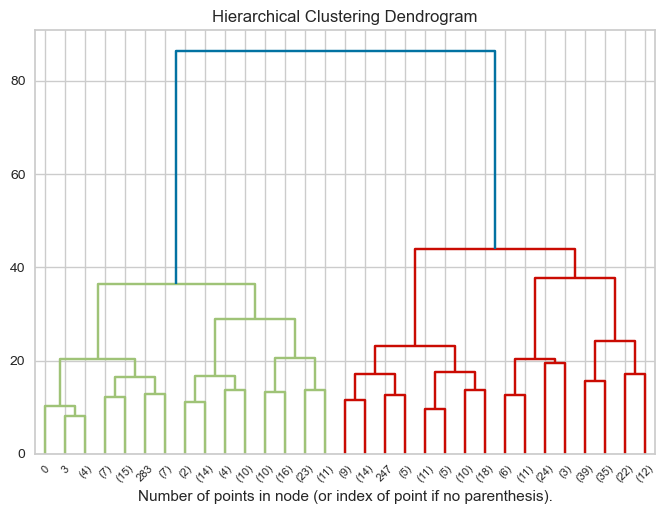

In [33]:
import numpy as np
from matplotlib import pyplot as plt
from scipy.cluster.hierarchy import dendrogram

from sklearn.cluster import AgglomerativeClustering
nomes_jogadores = df['Jogador'].tolist()


def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)


X = df_atrib_relevantes_normalizadoZ

# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=20, n_clusters=None)
clusters = model.fit_predict(X)
df_clustersAC = pd.DataFrame({'Jogador': nomes_jogadores, 'Cluster': clusters})

model = model.fit(X)
plt.title("Hierarchical Clustering Dendrogram")
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode="level", p=4)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [34]:
df_clustersAC.sort_values(by='Cluster')

,Jogador,Cluster
177,Daniel Podence,0
21,M. Mount,0
240,K. Trippier,0
64,J. Ward-Prowse,0
234,Philippe Coutinho,0
...,...,...
336,J. Milner,10
38,M. Caicedo,10
49,P. Højbjerg,10
40,Casemiro,10


In [35]:
# Unir o DataFrame df_clusters com o DataFrame original df usando a coluna 'Jogador' como chave
df_com_clusters = df.merge(df_clustersAC[['Cluster']], left_index=True, right_index=True)
# Exibir o DataFrame resultante com a informação do cluster
df_com_clusters

,Jogador,Equipa,Posição,Idade,Valor de mercado,Contrato termina,Partidas jogadas,Minutos jogados:,Golos,Golos esperados,...,"Pontapés livres directos à baliza, %",Cantos/90,Penaltis marcados,"Conversão de penaltis, %",faixa_atuação,grupo_atuação,grupoE_atuação,Posição_principal,Grupo atuação principal,Cluster
0,E. Haaland,Manchester City,[CF],23,170000000,2027-06-30,35,2996,36,28.10,...,0.0,0.03,7,100.000,[Atacantes],[Ata],[Atacante],CF,Atacante,9
1,B. Saka,Arsenal,"[RWF, RAMF, RW]",21,110000000,2027-06-30,38,3468,14,10.13,...,0.0,2.54,3,66.667,"[Meias, Atacantes]",[Lado],[Extremo],RWF,Extremo,5
2,P. Foden,Manchester City,"[LWF, RWF, LAMF]",23,110000000,2027-06-30,32,2022,11,6.11,...,100.0,1.74,0,0.000,"[Meias, Atacantes]",[Lado],[Extremo],LWF,Extremo,5
3,H. Kane,Bayern München,[CF],30,90000000,2024-06-30,38,3739,30,21.41,...,0.0,0.00,6,83.333,[Atacantes],[Ata],[Atacante],CF,Atacante,9
4,E. Fernández,Chelsea,"[DMF, RCMF, LDMF]",22,85000000,2031-06-30,18,1699,0,0.98,...,0.0,0.16,0,0.000,[Meias],[Vol],"[Meia, Volante]",DMF,Volante,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346,T. Ream,Fulham,[LCB],36,1000000,2024-06-30,33,3177,1,0.53,...,0.0,0.00,0,0.000,[Defensores],[Def],[Zagueiro],LCB,Zagueiro,3
347,A. Ogbonna,West Ham United,"[LCB, CB]",35,1000000,2024-06-30,16,1366,0,0.17,...,0.0,0.00,0,0.000,[Defensores],[Def],[Zagueiro],LCB,Zagueiro,1
348,Hugo Bueno,Wolverhampton Wanderers,[LB],21,200000,2026-06-30,21,1428,0,0.14,...,0.0,1.13,0,0.000,[Defensores],[Def],[Lateral E],LB,Lateral E,6
349,D. Ouattara,Bournemouth,"[RW, RAMF]",21,0,2026-06-30,19,1336,1,3.18,...,0.0,0.07,0,0.000,"[Meias, Atacantes]",[Lado],[Extremo],RW,Extremo,7


In [36]:
df_normalizadoZ = df_atrib_relevantes_normalizadoZ.merge(df_clustersAC[['Cluster']], left_index=True, right_index=True)


In [42]:
import pandas as pd

# Substitua 'df_atrib_normalizadoMinMax' pelo nome do seu DataFrame
X = df_normalizadoZ

# Agrupe o DataFrame pelo cluster
clusters = X.groupby('Cluster')


# Dicionário para armazenar os resultados
resultados = {}

# Loop pelos clusters
for cluster, grupo in clusters:
    # Calcula a média dos atributos para o cluster atual
    media_cluster = grupo.mean()
    #print("media cluster:", media_cluster)
    # Calcula a média dos atributos para o DataFrame completo comparada aos df da posição
    media_total = X.drop('Cluster', axis=1).mean()
    #print("media total", media_total)
    #media_total = df_atrib_geral_normalizadoZ.mean()

    
    # Calcula a diferença entre a média do cluster e a média total
    diferenca = media_cluster - media_total
    #print("diferença",diferenca)
    
    # Ordena os atributos pela maior diferença e pega os top 10
    diff_atrib = (diferenca.abs() - 0.00001).nlargest(46)  # -0.00001 para evitar erros de arredondamento
    
    # Armazena os resultados no dicionário
    resultados[cluster] = {
        'Atributos': diff_atrib.index.tolist(),
        'Diferença Média Cluster-Total': (media_cluster[diff_atrib.index] - media_total[diff_atrib.index]).tolist(),
        'Valor Médio no Cluster': media_cluster[diff_atrib.index].tolist(),
        'Valor Médio Total': media_total[diff_atrib.index].tolist()
    }
#resultados

In [43]:
df_aux=pd.DataFrame()
df_aux['Atributos']=df_atrib_relevantes.columns
for cluster, resultado in resultados.items():
    #print(f'Cluster {cluster}:')
    df_resultado = pd.DataFrame(resultado)
    df_resultado = df_resultado.sort_values(by='Diferença Média Cluster-Total', ascending=False)
    df_resultado[f'cluster:{cluster}'] = df_resultado['Diferença Média Cluster-Total']
    
    # Faça o join com o df_aux
    df_aux = df_aux.join(df_resultado.set_index('Atributos')[[f'cluster:{cluster}']], on='Atributos')
    #display(df_resultado)
    #print('\n')
# Redefina o índice
df_aux.reset_index(drop=True, inplace=True)
df_aux

,Atributos,cluster:0,cluster:1,cluster:2,cluster:3,cluster:4,cluster:5,cluster:6,cluster:7,cluster:8,cluster:9,cluster:10
0,Golos esperados/90,0.071739,-0.588784,-0.670194,-0.605068,1.448463,1.337833,-0.599420,0.346269,-0.032272,3.677891,-0.466477
1,Ações defensivas com êxito/90,-0.395273,0.773695,0.833349,0.243994,-1.468264,-1.124312,0.716615,-0.769452,-0.186644,-1.836533,0.470657
2,Duelos defensivos/90,-0.044189,-0.378235,1.068126,-0.405712,-1.269326,-0.761148,0.740262,-0.185217,0.202735,-1.776001,0.653053
3,"Duelos defensivos ganhos, %",-0.328036,1.042083,-0.221151,0.903502,-1.136244,-0.498847,0.263057,-0.371250,-0.259479,-1.002551,-0.041552
4,Duelos aérios/90,-0.745920,0.640878,-0.319824,0.305734,1.439364,-0.540024,-0.193547,-0.315714,-0.282797,1.383843,-0.524987
5,"Duelos aéreos ganhos, %",-0.391941,1.063308,0.274829,1.065440,-0.633264,-0.844447,0.276685,-1.084000,-0.699106,-0.292287,0.246941
6,Cortes/90,-0.279420,-0.025420,0.203102,-0.149725,-0.560013,-0.634041,0.711450,-0.511199,0.044342,-0.864486,0.628733
7,Remates intercetados/90,-0.610526,1.829202,0.021758,0.499614,-0.584009,-0.871165,0.124964,-0.799169,-0.370385,-0.606981,-0.257515
8,Interseções/90,-0.477133,1.305805,0.688397,0.519838,-1.261881,-1.107151,0.473023,-0.948604,-0.366892,-1.536767,0.236823
9,Faltas/90,-0.027444,0.819997,-0.021256,0.770009,-0.674629,0.065387,-0.340848,0.028168,-0.308323,-0.258863,-0.284387


In [44]:
for coluna in df_aux.columns[1:]:
    # Encontre os 10 maiores valores e seus atributos
    maiores = df_aux.nlargest(10, coluna)
    print(f"10 maiores valores para o cluster {coluna}:")
    print(maiores[['Atributos', coluna]])

    # Encontre os 10 menores valores e seus atributos
    menores = df_aux.nsmallest(10, coluna)
    print(f"10 menores valores para o cluster {coluna}:")
    print(menores[['Atributos', coluna]])

    print("\n")

10 maiores valores para o cluster cluster:0:
                        Atributos  cluster:0
42      Passes em profundidade/90   1.808955
38         Passes inteligentes/90   1.774888
36    Assistências para remate/90   1.255822
35      Assistências esperadas/90   1.008922
45  Passes progressivos certos, %   0.996689
39                Passes chave/90   0.935205
37       Segundas assistências/90   0.749970
13                         Remate   0.723208
40     Passes para terço final/90   0.692854
18                 Cruzamentos/90   0.692447
10 menores valores para o cluster cluster:0:
                        Atributos  cluster:0
4                Duelos aérios/90  -0.745920
7         Remates intercetados/90  -0.610526
8                  Interseções/90  -0.477133
1   Ações defensivas com êxito/90  -0.395273
5         Duelos aéreos ganhos, %  -0.391941
3     Duelos defensivos ganhos, %  -0.328036
6                       Cortes/90  -0.279420
12             Golos de cabeça/90  -0.169745
15        

In [45]:
df_aux = df_aux.set_index('Atributos')
df_aux

,cluster:0,cluster:1,cluster:2,cluster:3,cluster:4,cluster:5,cluster:6,cluster:7,cluster:8,cluster:9,cluster:10
Atributos,,,,,,,,,,,
Golos esperados/90,0.071739,-0.588784,-0.670194,-0.605068,1.448463,1.337833,-0.599420,0.346269,-0.032272,3.677891,-0.466477
Ações defensivas com êxito/90,-0.395273,0.773695,0.833349,0.243994,-1.468264,-1.124312,0.716615,-0.769452,-0.186644,-1.836533,0.470657
Duelos defensivos/90,-0.044189,-0.378235,1.068126,-0.405712,-1.269326,-0.761148,0.740262,-0.185217,0.202735,-1.776001,0.653053
"Duelos defensivos ganhos, %",-0.328036,1.042083,-0.221151,0.903502,-1.136244,-0.498847,0.263057,-0.371250,-0.259479,-1.002551,-0.041552
Duelos aérios/90,-0.745920,0.640878,-0.319824,0.305734,1.439364,-0.540024,-0.193547,-0.315714,-0.282797,1.383843,-0.524987
"Duelos aéreos ganhos, %",-0.391941,1.063308,0.274829,1.065440,-0.633264,-0.844447,0.276685,-1.084000,-0.699106,-0.292287,0.246941
Cortes/90,-0.279420,-0.025420,0.203102,-0.149725,-0.560013,-0.634041,0.711450,-0.511199,0.044342,-0.864486,0.628733
Remates intercetados/90,-0.610526,1.829202,0.021758,0.499614,-0.584009,-0.871165,0.124964,-0.799169,-0.370385,-0.606981,-0.257515
Interseções/90,-0.477133,1.305805,0.688397,0.519838,-1.261881,-1.107151,0.473023,-0.948604,-0.366892,-1.536767,0.236823


In [46]:
from sklearn.preprocessing import MinMaxScaler

# Supondo que você tem um DataFrame chamado df_aux_zag com 47 linhas e 8 colunas (clusters)
# Crie uma instância do MinMaxScaler
scaler = MinMaxScaler()

# Ajuste o scaler aos dados e normalize o DataFrame
df_aux_normalized = scaler.fit_transform(df_aux)

# Crie um novo DataFrame com os valores normalizados
df_aux_norm = pd.DataFrame(df_aux_normalized, columns=df_aux.columns)

# Exibe o DataFrame normalizado
df_aux_norm

,cluster:0,cluster:1,cluster:2,cluster:3,cluster:4,cluster:5,cluster:6,cluster:7,cluster:8,cluster:9,cluster:10
0,0.320039,0.184754,0.029644,0.156361,1.000000,0.835773,0.047035,0.541531,0.614368,1.000000,0.085690
1,0.137246,0.644126,0.825978,0.462350,0.054603,0.000000,0.983179,0.119095,0.479502,0.000000,0.418122
2,0.274664,0.255742,0.950325,0.228206,0.119084,0.123276,1.000000,0.340299,0.819680,0.010977,0.482824
3,0.163564,0.734616,0.267474,0.700027,0.162221,0.212314,0.660547,0.269863,0.415871,0.151237,0.236425
4,0.000000,0.599346,0.215213,0.484601,0.997051,0.198336,0.335747,0.290890,0.395499,0.583991,0.064934
5,0.138551,0.741772,0.530164,0.758387,0.325251,0.095000,0.670241,0.000000,0.031795,0.280038,0.338762
6,0.182592,0.374697,0.492175,0.320460,0.348994,0.166422,0.979505,0.216875,0.681301,0.176274,0.474197
7,0.052994,1.000000,0.396128,0.554472,0.341216,0.085931,0.562316,0.107843,0.318979,0.222970,0.159815
8,0.105206,0.823532,0.749205,0.561760,0.121498,0.005825,0.809903,0.051264,0.322030,0.054360,0.335173
9,0.281218,0.659737,0.373346,0.651918,0.311844,0.403842,0.230967,0.421091,0.373199,0.286099,0.150283


In [47]:
soma_colunas = df_aux_norm.sum()

# Normalize as colunas dividindo pelo total de cada coluna
df_aux_norm = df_aux_norm.div(soma_colunas, axis=1)

## AQUI ESTÂO OS PESOS DE ZAGUEIROS
df_aux_norm

,cluster:0,cluster:1,cluster:2,cluster:3,cluster:4,cluster:5,cluster:6,cluster:7,cluster:8,cluster:9,cluster:10
0,0.016956,0.011680,0.001764,0.008172,0.049168,0.036661,0.002572,0.028720,0.027004,0.058106,0.005579
1,0.007271,0.040720,0.049149,0.024164,0.002685,0.000000,0.053767,0.006316,0.021076,0.000000,0.027220
2,0.014552,0.016167,0.056548,0.011927,0.005855,0.005407,0.054687,0.018047,0.036028,0.000638,0.031433
3,0.008666,0.046441,0.015916,0.036586,0.007976,0.009313,0.036123,0.014312,0.018279,0.008788,0.015392
4,0.000000,0.037889,0.012806,0.025327,0.049023,0.008700,0.018361,0.015427,0.017384,0.033933,0.004227
5,0.007341,0.046893,0.031547,0.039636,0.015992,0.004167,0.036653,0.000000,0.001398,0.016272,0.022054
6,0.009674,0.023688,0.029286,0.016748,0.017159,0.007300,0.053566,0.011502,0.029946,0.010243,0.030871
7,0.002808,0.063218,0.023571,0.028979,0.016777,0.003769,0.030751,0.005719,0.014020,0.012956,0.010404
8,0.005574,0.052062,0.044580,0.029359,0.005974,0.000256,0.044291,0.002719,0.014155,0.003159,0.021820
9,0.014899,0.041707,0.022215,0.034071,0.015333,0.017714,0.012631,0.022332,0.016404,0.016624,0.009784


In [48]:
import numpy as np

# Suponha que você tenha o DataFrame df_atrib_normalizadoMinMax (392x47)
# e o DataFrame df_aux_norm (47x8)

# Converta os DataFrames em matrizes NumPy
matriz_atrib = df_atrib_relevantes_normalizadoZ.to_numpy()
matriz_aux = df_aux_norm.to_numpy()

# Realize a multiplicação de matrizes
matriz_resultante = np.dot(matriz_atrib, matriz_aux)

# Crie um novo DataFrame a partir da matriz resultante
df_resultado = pd.DataFrame(matriz_resultante)
# Renomeie as colunas do DataFrame df_resultado
novo_nome_colunas = {i: f'indice_perf_{i}' for i in range(12)}
df_resultado.rename(columns=novo_nome_colunas, inplace=True)
# Agora, o DataFrame df_resultado terá as métricas ponderadas para cada jogador em relação a cada cluster
df_resultado

,indice_perf_0,indice_perf_1,indice_perf_2,indice_perf_3,indice_perf_4,indice_perf_5,indice_perf_6,indice_perf_7,indice_perf_8,indice_perf_9,indice_perf_10
0,0.534813,-0.238545,-0.557038,-0.188119,1.454791,1.246422,-0.401149,0.826200,0.883053,1.745326,-0.277703
1,0.657503,-0.237634,0.167766,-0.067218,0.840318,1.065884,-0.043009,1.075614,0.818561,0.864575,0.100552
2,0.891474,0.065530,0.321908,0.246068,0.976215,1.131967,0.084863,1.050233,0.863586,1.017257,0.339975
3,0.759280,0.051684,-0.138537,0.031513,1.223263,1.080836,-0.197259,0.873256,0.841295,1.553146,0.131613
4,0.452173,0.474793,0.323928,0.632160,-0.189154,0.006922,0.367441,-0.043476,-0.163791,-0.121476,0.835868
...,...,...,...,...,...,...,...,...,...,...,...
346,-0.136003,0.587413,0.094710,0.653675,-0.315746,-0.355274,0.411845,-0.462764,-0.281137,-0.323135,0.305245
347,-0.722494,-0.098760,-0.539320,-0.312270,-0.714766,-0.815166,-0.390212,-0.864209,-0.809097,-0.719209,-0.529292
348,-0.127284,-0.108521,0.230586,-0.103367,-0.229091,-0.122009,0.017228,-0.003490,-0.056940,-0.304780,-0.139866
349,0.120255,-0.104226,0.244272,-0.252726,0.323933,0.299020,-0.178190,0.497908,0.313215,0.283874,-0.189129


In [49]:
# Encontrar o índice performático máximo e seu cluster correspondente para cada jogador
df_resultado['final_indice_perfil'] = df_resultado.max(axis=1)
df_resultado['final_indice_perfil_cluster'] = df_resultado.idxmax(axis=1)


# Separar o nome do cluster do nome da coluna
df_resultado['final_indice_perfil_cluster'] = df_resultado['final_indice_perfil_cluster'].apply(lambda x: x.split('_')[-1])
df_resultado

,indice_perf_0,indice_perf_1,indice_perf_2,indice_perf_3,indice_perf_4,indice_perf_5,indice_perf_6,indice_perf_7,indice_perf_8,indice_perf_9,indice_perf_10,final_indice_perfil,final_indice_perfil_cluster
0,0.534813,-0.238545,-0.557038,-0.188119,1.454791,1.246422,-0.401149,0.826200,0.883053,1.745326,-0.277703,1.745326,9
1,0.657503,-0.237634,0.167766,-0.067218,0.840318,1.065884,-0.043009,1.075614,0.818561,0.864575,0.100552,1.075614,7
2,0.891474,0.065530,0.321908,0.246068,0.976215,1.131967,0.084863,1.050233,0.863586,1.017257,0.339975,1.131967,5
3,0.759280,0.051684,-0.138537,0.031513,1.223263,1.080836,-0.197259,0.873256,0.841295,1.553146,0.131613,1.553146,9
4,0.452173,0.474793,0.323928,0.632160,-0.189154,0.006922,0.367441,-0.043476,-0.163791,-0.121476,0.835868,0.835868,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...
346,-0.136003,0.587413,0.094710,0.653675,-0.315746,-0.355274,0.411845,-0.462764,-0.281137,-0.323135,0.305245,0.653675,3
347,-0.722494,-0.098760,-0.539320,-0.312270,-0.714766,-0.815166,-0.390212,-0.864209,-0.809097,-0.719209,-0.529292,-0.098760,1
348,-0.127284,-0.108521,0.230586,-0.103367,-0.229091,-0.122009,0.017228,-0.003490,-0.056940,-0.304780,-0.139866,0.230586,2
349,0.120255,-0.104226,0.244272,-0.252726,0.323933,0.299020,-0.178190,0.497908,0.313215,0.283874,-0.189129,0.497908,7


In [50]:
# Lista de colunas para as quais você quer calcular os percentis
indice_perf_cols = [col for col in df_resultado.columns if col.startswith('indice_perf_')]


# Para cada coluna 'indice_perf_[x]', calcule o percentil e crie a coluna correspondente 'percentile_cluster_[x]'
for col in indice_perf_cols:
    percentile_col = 'percentile_cluster_' + col.split('_')[-1] # Ajuste conforme o nome da coluna
    df_resultado[percentile_col] = df_resultado[col].rank(pct=True)
    
df_resultado['final_percentile'] =df_resultado[[col for col in df_resultado if col.startswith('percentile_cluster_')]].max(axis=1)

# Criar uma nova coluna 'final_percentile_cluster' que indica de qual coluna 'percentile_cluster_[x]' veio o maior valor
# Isso é feito obtendo o índice do valor máximo nas colunas de percentil para cada linha
df_resultado['final_percentile_cluster'] = df_resultado[[col for col in df_resultado if col.startswith('percentile_cluster_')]].idxmax(axis=1)

# Converter o nome da coluna para o número do cluster correspondente
df_resultado['final_percentile_cluster'] = df_resultado['final_percentile_cluster'].apply(lambda x: x.split('_')[-1])

df_resultado

,indice_perf_0,indice_perf_1,indice_perf_2,indice_perf_3,indice_perf_4,indice_perf_5,indice_perf_6,indice_perf_7,indice_perf_8,indice_perf_9,...,percentile_cluster_3,percentile_cluster_4,percentile_cluster_5,percentile_cluster_6,percentile_cluster_7,percentile_cluster_8,percentile_cluster_9,percentile_cluster_10,final_percentile,final_percentile_cluster
0,0.534813,-0.238545,-0.557038,-0.188119,1.454791,1.246422,-0.401149,0.826200,0.883053,1.745326,...,0.330484,1.000000,0.988604,0.162393,0.945869,0.985755,1.000000,0.216524,1.000000,4
1,0.657503,-0.237634,0.167766,-0.067218,0.840318,1.065884,-0.043009,1.075614,0.818561,0.864575,...,0.415954,0.960114,0.977208,0.398860,0.988604,0.971510,0.954416,0.606838,0.988604,7
2,0.891474,0.065530,0.321908,0.246068,0.976215,1.131967,0.084863,1.050233,0.863586,1.017257,...,0.712251,0.971510,0.985755,0.541311,0.980057,0.977208,0.968661,0.829060,0.985755,5
3,0.759280,0.051684,-0.138537,0.031513,1.223263,1.080836,-0.197259,0.873256,0.841295,1.553146,...,0.532764,0.997151,0.980057,0.270655,0.954416,0.974359,0.997151,0.641026,0.997151,4
4,0.452173,0.474793,0.323928,0.632160,-0.189154,0.006922,0.367441,-0.043476,-0.163791,-0.121476,...,0.931624,0.381766,0.566952,0.840456,0.532764,0.367521,0.475783,0.980057,0.980057,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346,-0.136003,0.587413,0.094710,0.653675,-0.315746,-0.355274,0.411845,-0.462764,-0.281137,-0.323135,...,0.943020,0.245014,0.256410,0.877493,0.153846,0.236467,0.264957,0.794872,0.943020,3
347,-0.722494,-0.098760,-0.539320,-0.312270,-0.714766,-0.815166,-0.390212,-0.864209,-0.809097,-0.719209,...,0.230769,0.005698,0.005698,0.173789,0.005698,0.005698,0.005698,0.108262,0.418803,1
348,-0.127284,-0.108521,0.230586,-0.103367,-0.229091,-0.122009,0.017228,-0.003490,-0.056940,-0.304780,...,0.390313,0.333333,0.472934,0.467236,0.564103,0.492877,0.276353,0.350427,0.752137,2
349,0.120255,-0.104226,0.244272,-0.252726,0.323933,0.299020,-0.178190,0.497908,0.313215,0.283874,...,0.290598,0.797721,0.752137,0.279202,0.829060,0.800570,0.766382,0.290598,0.829060,7


In [51]:
from scipy.stats import zscore

# Identificando todas as colunas que começam com 'indice_perf_'
indice_perf_cols = [col for col in df_resultado.columns if col.startswith('indice_perf_')]

# Calculando os Z-Scores para cada coluna 'indice_perf_'
zscore_cols = []
for col in indice_perf_cols:
    zscore_col = f'zscore_{col}'
    df_resultado[zscore_col] = zscore(df_resultado[col])
    zscore_cols.append(zscore_col)

# Função para selecionar o Z-Score apropriado
def select_appropriate_zscore(row):
    cluster = row['final_percentile_cluster']
    selected_perf_col = f'indice_perf_{cluster}'
    return row[f'zscore_{selected_perf_col}']

# Aplicando a função para criar a nova coluna 'Final_Indice_normZ'
df_resultado['Final_Indice_normZ'] = df_resultado.apply(select_appropriate_zscore, axis=1)

# Removendo as colunas de Z-Score
df_resultado.drop(columns=zscore_cols, inplace=True)
df_resultado

,indice_perf_0,indice_perf_1,indice_perf_2,indice_perf_3,indice_perf_4,indice_perf_5,indice_perf_6,indice_perf_7,indice_perf_8,indice_perf_9,...,percentile_cluster_4,percentile_cluster_5,percentile_cluster_6,percentile_cluster_7,percentile_cluster_8,percentile_cluster_9,percentile_cluster_10,final_percentile,final_percentile_cluster,Final_Indice_normZ
0,0.534813,-0.238545,-0.557038,-0.188119,1.454791,1.246422,-0.401149,0.826200,0.883053,1.745326,...,1.000000,0.988604,0.162393,0.945869,0.985755,1.000000,0.216524,1.000000,4,3.524724
1,0.657503,-0.237634,0.167766,-0.067218,0.840318,1.065884,-0.043009,1.075614,0.818561,0.864575,...,0.960114,0.977208,0.398860,0.988604,0.971510,0.954416,0.606838,0.988604,7,2.312918
2,0.891474,0.065530,0.321908,0.246068,0.976215,1.131967,0.084863,1.050233,0.863586,1.017257,...,0.971510,0.985755,0.541311,0.980057,0.977208,0.968661,0.829060,0.985755,5,2.457898
3,0.759280,0.051684,-0.138537,0.031513,1.223263,1.080836,-0.197259,0.873256,0.841295,1.553146,...,0.997151,0.980057,0.270655,0.954416,0.974359,0.997151,0.641026,0.997151,4,2.963768
4,0.452173,0.474793,0.323928,0.632160,-0.189154,0.006922,0.367441,-0.043476,-0.163791,-0.121476,...,0.381766,0.566952,0.840456,0.532764,0.367521,0.475783,0.980057,0.980057,10,2.081051
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346,-0.136003,0.587413,0.094710,0.653675,-0.315746,-0.355274,0.411845,-0.462764,-0.281137,-0.323135,...,0.245014,0.256410,0.877493,0.153846,0.236467,0.264957,0.794872,0.943020,3,1.574976
347,-0.722494,-0.098760,-0.539320,-0.312270,-0.714766,-0.815166,-0.390212,-0.864209,-0.809097,-0.719209,...,0.005698,0.005698,0.173789,0.005698,0.005698,0.005698,0.108262,0.418803,1,-0.240451
348,-0.127284,-0.108521,0.230586,-0.103367,-0.229091,-0.122009,0.017228,-0.003490,-0.056940,-0.304780,...,0.333333,0.472934,0.467236,0.564103,0.492877,0.276353,0.350427,0.752137,2,0.658752
349,0.120255,-0.104226,0.244272,-0.252726,0.323933,0.299020,-0.178190,0.497908,0.313215,0.283874,...,0.797721,0.752137,0.279202,0.829060,0.800570,0.766382,0.290598,0.829060,7,1.070664


In [52]:
df_indices_completo = df.merge(df_resultado, left_index=True, right_index=True)
df_indices_completo

,Jogador,Equipa,Posição,Idade,Valor de mercado,Contrato termina,Partidas jogadas,Minutos jogados:,Golos,Golos esperados,...,percentile_cluster_4,percentile_cluster_5,percentile_cluster_6,percentile_cluster_7,percentile_cluster_8,percentile_cluster_9,percentile_cluster_10,final_percentile,final_percentile_cluster,Final_Indice_normZ
0,E. Haaland,Manchester City,[CF],23,170000000,2027-06-30,35,2996,36,28.10,...,1.000000,0.988604,0.162393,0.945869,0.985755,1.000000,0.216524,1.000000,4,3.524724
1,B. Saka,Arsenal,"[RWF, RAMF, RW]",21,110000000,2027-06-30,38,3468,14,10.13,...,0.960114,0.977208,0.398860,0.988604,0.971510,0.954416,0.606838,0.988604,7,2.312918
2,P. Foden,Manchester City,"[LWF, RWF, LAMF]",23,110000000,2027-06-30,32,2022,11,6.11,...,0.971510,0.985755,0.541311,0.980057,0.977208,0.968661,0.829060,0.985755,5,2.457898
3,H. Kane,Bayern München,[CF],30,90000000,2024-06-30,38,3739,30,21.41,...,0.997151,0.980057,0.270655,0.954416,0.974359,0.997151,0.641026,0.997151,4,2.963768
4,E. Fernández,Chelsea,"[DMF, RCMF, LDMF]",22,85000000,2031-06-30,18,1699,0,0.98,...,0.381766,0.566952,0.840456,0.532764,0.367521,0.475783,0.980057,0.980057,10,2.081051
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346,T. Ream,Fulham,[LCB],36,1000000,2024-06-30,33,3177,1,0.53,...,0.245014,0.256410,0.877493,0.153846,0.236467,0.264957,0.794872,0.943020,3,1.574976
347,A. Ogbonna,West Ham United,"[LCB, CB]",35,1000000,2024-06-30,16,1366,0,0.17,...,0.005698,0.005698,0.173789,0.005698,0.005698,0.005698,0.108262,0.418803,1,-0.240451
348,Hugo Bueno,Wolverhampton Wanderers,[LB],21,200000,2026-06-30,21,1428,0,0.14,...,0.333333,0.472934,0.467236,0.564103,0.492877,0.276353,0.350427,0.752137,2,0.658752
349,D. Ouattara,Bournemouth,"[RW, RAMF]",21,0,2026-06-30,19,1336,1,3.18,...,0.797721,0.752137,0.279202,0.829060,0.800570,0.766382,0.290598,0.829060,7,1.070664


In [53]:
ordered_columns = ['Jogador', 'Equipa', 'Posição', 'Grupo atuação principal', 'final_percentile','final_percentile_cluster','Final_Indice_normZ'] 

df_indices_completo = df_indices_completo[ordered_columns].sort_values(by= 'Final_Indice_normZ', ascending=False)

In [54]:
df_indices_completo.head(30)

,Jogador,Equipa,Posição,Grupo atuação principal,final_percentile,final_percentile_cluster,Final_Indice_normZ
6,K. De Bruyne,Manchester City,"[RCMF, AMF]",Meia,1.000000,0,5.128450
0,E. Haaland,Manchester City,[CF],Atacante,1.000000,4,3.524724
13,Bruno Fernandes,Manchester United,"[AMF, RAMF]",Meia,0.997151,0,3.356158
23,T. Alexander-Arnold,Liverpool,[RB],Lateral D,1.000000,2,3.324452
240,K. Trippier,Newcastle United,[RB],Lateral D,0.994302,2,3.084482
68,A. Saint-Maximin,Newcastle United,[LWF],Extremo,0.997151,7,3.070799
3,H. Kane,Bayern München,[CF],Atacante,0.997151,4,2.963768
18,Mohamed Salah,Liverpool,"[RWF, CF]",Extremo,0.997151,5,2.942479
20,J. Grealish,Manchester City,"[LWF, LAMF, LW]",Extremo,0.997151,8,2.806731
155,Roberto Firmino,Al Ahli,"[CF, AMF]",Atacante,0.988604,4,2.762093


In [65]:
ordered_columns = ['Jogador', 'Equipa',  'Grupo atuação principal', 'final_percentile','final_percentile_cluster','Final_Indice_normZ'] 

df_indices_completo = df_indices_completo[ordered_columns].sort_values(by= 'Final_Indice_normZ', ascending=False)
grupos = df_indices_completo.groupby('Grupo atuação principal')

# Isso criará um dicionário de DataFrames, cada um contendo dados de um grupo de atuação
dfs_separados = {grupo: dados for grupo, dados in grupos}


In [66]:
dfs_separados['Atacante'].head(20)

,Jogador,Equipa,Grupo atuação principal,final_percentile,final_percentile_cluster,Final_Indice_normZ
0,E. Haaland,Manchester City,Atacante,1.000000,4,3.524724
3,H. Kane,Bayern München,Atacante,0.997151,4,2.963768
155,Roberto Firmino,Al Ahli,Atacante,0.988604,4,2.762093
110,A. Mitrović,Al Hilal,Atacante,0.982906,9,2.719141
187,C. Wilson,Newcastle United,Atacante,0.977208,9,2.551488
19,D. Núñez,Liverpool,Atacante,0.982906,4,2.502211
11,Gabriel Jesus,Arsenal,Atacante,0.988604,8,2.429375
5,M. Rashford,Manchester United,Atacante,0.971510,9,2.367217
39,I. Toney,Brentford,Atacante,0.962963,9,2.127141
104,L. Trossard,Arsenal,Atacante,0.968661,0,2.102916


In [67]:
dfs_separados['Extremo']

,Jogador,Equipa,Grupo atuação principal,final_percentile,final_percentile_cluster,Final_Indice_normZ
68,A. Saint-Maximin,Newcastle United,Extremo,0.997151,7,3.070799
18,Mohamed Salah,Liverpool,Extremo,0.997151,5,2.942479
20,J. Grealish,Manchester City,Extremo,0.997151,8,2.806731
2,P. Foden,Manchester City,Extremo,0.985755,5,2.457898
15,Gabriel Martinelli,Arsenal,Extremo,0.982906,5,2.421803
1,B. Saka,Arsenal,Extremo,0.988604,7,2.312918
100,R. Mahrez,Al Ahli,Extremo,0.977208,7,2.149211
12,L. Díaz,Liverpool,Extremo,0.968661,8,2.112562
160,K. Mitoma,Brighton,Extremo,0.968661,7,2.051096
114,M. Olise,Crystal Palace,Extremo,0.965812,7,2.014022


In [68]:
dfs_separados['Meia'].head(20)

,Jogador,Equipa,Grupo atuação principal,final_percentile,final_percentile_cluster,Final_Indice_normZ
6,K. De Bruyne,Manchester City,Meia,1.000000,0,5.128450
13,Bruno Fernandes,Manchester United,Meia,0.997151,0,3.356158
9,M. Ødegaard,Arsenal,Meia,0.985755,0,2.526509
37,J. Maddison,Tottenham Hotspur,Meia,0.974359,0,2.174387
188,Thiago Alcântara,Liverpool,Meia,0.994302,6,1.900836
336,J. Milner,Brighton,Meia,0.971510,2,1.862024
139,İ. Gündoğan,Barcelona,Meia,0.945869,0,1.669358
273,J. Henderson,Al Ettifaq,Meia,0.957265,10,1.652214
49,P. Højbjerg,Tottenham Hotspur,Meia,0.945869,10,1.499749
53,Lucas Paquetà,West Ham United,Meia,0.923077,0,1.431375


In [69]:
dfs_separados['Volante'].head(20)

,Jogador,Equipa,Grupo atuação principal,final_percentile,final_percentile_cluster,Final_Indice_normZ
40,Casemiro,Manchester United,Volante,1.000000,6,2.134294
4,E. Fernández,Chelsea,Volante,0.980057,10,2.081051
8,Rodri,Manchester City,Volante,0.982906,3,1.945911
31,Bruno Guimarães,Newcastle United,Volante,0.968661,10,1.808971
99,Y. Tielemans,Aston Villa,Volante,0.965812,10,1.786002
133,C. Eriksen,Manchester United,Volante,0.934473,10,1.452433
63,Rúben Neves,Al Hilal,Volante,0.928775,10,1.422225
65,T. Partey,Arsenal,Volante,0.923077,10,1.412136
10,D. Rice,Arsenal,Volante,0.940171,6,1.345267
73,Jorginho,Arsenal,Volante,0.897436,10,1.262585


In [70]:
dfs_separados['Lateral D']

,Jogador,Equipa,Grupo atuação principal,final_percentile,final_percentile_cluster,Final_Indice_normZ
23,T. Alexander-Arnold,Liverpool,Lateral D,1.000000,2,3.324452
240,K. Trippier,Newcastle United,Lateral D,0.994302,2,3.084482
17,R. James,Chelsea,Lateral D,0.974359,2,1.885024
75,Pedro Porro,Tottenham Hotspur,Lateral D,0.968661,2,1.773454
226,K. Walker,Manchester City,Lateral D,0.945869,3,1.612303
255,K. Tete,Fulham,Lateral D,0.974359,6,1.576150
298,P. Groß,Brighton,Lateral D,0.931624,0,1.564464
76,Diogo Dalot,Manchester United,Lateral D,0.957265,2,1.552497
41,B. White,Arsenal,Lateral D,0.940171,10,1.459326
287,V. Coufal,West Ham United,Lateral D,0.951567,2,1.448417


In [71]:
dfs_separados['Lateral E']

,Jogador,Equipa,Grupo atuação principal,final_percentile,final_percentile_cluster,Final_Indice_normZ
79,N. Aké,Manchester City,Lateral E,1.000000,3,2.391030
30,João Cancelo,Barcelona,Lateral E,0.991453,2,2.294256
47,A. Robertson,Liverpool,Lateral E,0.988604,2,2.163389
272,I. Perišić,Tottenham Hotspur,Lateral E,0.985755,2,2.102036
189,K. Tsimikas,Liverpool,Lateral E,0.962963,2,1.709413
57,O. Zinchenko,Arsenal,Lateral E,0.960114,10,1.694070
61,Marc Cucurella,Chelsea,Lateral E,0.960114,2,1.632789
72,L. Shaw,Manchester United,Lateral E,0.982906,6,1.610244
178,P. Estupiñán,Brighton,Lateral E,0.945869,2,1.378648
260,A. Robinson,Fulham,Lateral E,0.920228,2,1.251412


In [72]:
dfs_separados['Zagueiro'].head(20)

,Jogador,Equipa,Grupo atuação principal,final_percentile,final_percentile_cluster,Final_Indice_normZ
92,A. Laporte,Manchester City,Zagueiro,0.997151,3,2.344739
14,Rúben Dias,Manchester City,Zagueiro,0.991453,3,2.191832
329,Thiago Silva,Chelsea,Zagueiro,1.000000,1,2.186920
62,B. Badiashile,Chelsea,Zagueiro,0.988604,3,2.055442
44,L. Martínez,Manchester United,Zagueiro,0.997151,1,1.961603
50,V. van Dijk,Liverpool,Zagueiro,0.991453,1,1.920605
98,J. Gomez,Liverpool,Zagueiro,0.977208,3,1.815353
147,J. Tarkowski,Everton,Zagueiro,0.988604,1,1.805844
209,L. Colwill,Chelsea,Zagueiro,0.971510,3,1.789504
83,J. Andersen,Crystal Palace,Zagueiro,0.985755,1,1.774310
